# PEC 2 Asignatura Aprendizaje Automático Aplicado

## Máster en Data Science - UCJC

### Curso 2023/2024

Profesor: Francisco Lamas López - francisco.lamas@ucjc.edu

- Fecha de entrega a los alumnos: miércoles **17ENE2024**


- Fecha límite de entrega de soluciones: miércoles **07FEB2024**


- Fecha orientativa de correcciones: miércoles **21FEB2024**

### INSTRUCCIONES:

Resolver individualmente las siguientes 12 preguntas (cada una de las cuales tiene idéntica valoración, 1/12 del total)


Se dará una puntuación sobre 10 a cada alumno para esta PEC2 (75% del total de PEC's)


Rellenar sobre este Notebook (entregar como archivo .ipynb)

**Aspectos importantes a tener en cuenta:**

- Seguir los pasos recomendados en cada una de las 12 preguntas (como listas de ítems en el markdown), ya que os servirán como guía para resolverlas

- Intentar siempre, en la parte de análisis y comparación, plotear y exponer gráficos cuando sea posible sobre los resultados obtenidos

- Comentar y argumentar los resultados obtenidos

**En caso de no poder entregarla a través del BlackBoard, enviar antes de la fecha límite al email francisco.lamas@ucjc.edu (explicar en el email error obtenido durante la subida a BlackBoard)**

### ALUMNO (APELLIDOS, NOMBRE):

BARANDIARÁN TORRES, DANIEL

### EMAIL ALUMNO:

daniel.barrandiaran@alumno.ucjc.edu

#### Uso de Datasets en la PEC2

En esta práctica, se deben utilizar los datasets que se especifiquen en los ejercicios del Conjunto 2, 3 y 4 (preguntas 4 a 12). Utilice datasets a elección del alumno en las preguntas 1, 2 y 3.

## Conjunto 1

### Pregunta 1

Evalúa al menos 3 modelos de clasificación supervisada (SVC, Regresor Logístico, KNN Classifier... por ejemplo) con distintos repartos de train-test y haciendo Cross-Validation sobre ellos. Busca una combinación de hiperarámetros óptima para cada uno de ellos para distintos test_sizes entre 0.1 y 0.4. Razonar cual sería el modelo que mejor generaliza los resultados, entre los entrenamientos realizados.

In [2]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

In [314]:
names = lambda obj, txt = "": print([name for name in dir(obj) if (name[0] != "_") and (txt in name)])

In [3]:
data = datasets.load_iris()

In [4]:
ext_target = data.target[:, None]
pd.DataFrame(
    np.concatenate((data.data, ext_target, data.target_names[ext_target]), axis=1),
    columns=data.feature_names + ['target label', 'target name'],
)

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target label,target name
0,5.1,3.5,1.4,0.2,0,setosa
1,4.9,3.0,1.4,0.2,0,setosa
2,4.7,3.2,1.3,0.2,0,setosa
3,4.6,3.1,1.5,0.2,0,setosa
4,5.0,3.6,1.4,0.2,0,setosa
...,...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2,virginica
146,6.3,2.5,5.0,1.9,2,virginica
147,6.5,3.0,5.2,2.0,2,virginica
148,6.2,3.4,5.4,2.3,2,virginica


In [5]:
X = data.data
y = data.target

In [6]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size = 0.1 , random_state=1)
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size = 0.2 , random_state=1)
X_train3, X_test3, y_train3, y_test3 = train_test_split(X, y, test_size = 0.3 , random_state=1)
X_train4, X_test4, y_train4, y_test4 = train_test_split(X, y, test_size = 0.4 , random_state=1)


CONJUNTOS KNN

In [12]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train1, y_train1)

KNeighborsClassifier()

In [32]:
print(knn.score(X_train1, y_train1))
print(knn.score(X_test1, y_test1))

0.9555555555555556
1.0


In [12]:
knn.fit(X_train2, y_train2)

KNeighborsClassifier()

In [20]:
print(knn.score(X_train2, y_train2))
print(knn.score(X_test2, y_test2))

0.95
1.0


In [15]:
knn.fit(X_train3, y_train3)

KNeighborsClassifier()

In [19]:
print(knn.score(X_train3, y_train3))
print(knn.score(X_test3, y_test3))

0.9523809523809523
0.9777777777777777


In [ ]:
knn.fit(X_train4, y_train4)

In [38]:
print(knn.score(X_train4, y_train4))
print(knn.score(X_test4, y_test4))

0.9444444444444444
0.9833333333333333


In [44]:
from sklearn.model_selection import cross_val_score
from sklearn import metrics

knn = KNeighborsClassifier(n_neighbors=5)

resultados_kfold = cross_val_score(knn,X,y,cv=5,scoring='accuracy')
print(f"Los resultados para las 5 particiones son: {resultados_kfold}")
print(f"Es decir, tiene un resultado de: {resultados_kfold.mean()} +/- {resultados_kfold.std()}")


Los resultados para las 5 particiones son: [0.96666667 1.         0.93333333 0.96666667 1.        ]
Es decir, tiene un resultado de: 0.9733333333333334 +/- 0.02494438257849294


In [45]:
knn = KNeighborsClassifier(n_neighbors=10)

resultados_kfold = cross_val_score(knn,X,y,cv=5,scoring='accuracy')
print(f"Los resultados para las 5 particiones son: {resultados_kfold}")
print(f"Es decir, tiene un resultado de: {resultados_kfold.mean()} +/- {resultados_kfold.std()}")


Los resultados para las 5 particiones son: [0.96666667 1.         1.         0.93333333 1.        ]
Es decir, tiene un resultado de: 0.9800000000000001 +/- 0.02666666666666666


In [46]:
knn = KNeighborsClassifier(n_neighbors=15)

resultados_kfold = cross_val_score(knn,X,y,cv=5,scoring='accuracy')
print(f"Los resultados para las 5 particiones son: {resultados_kfold}")
print(f"Es decir, tiene un resultado de: {resultados_kfold.mean()} +/- {resultados_kfold.std()}")


Los resultados para las 5 particiones son: [0.93333333 1.         0.93333333 0.96666667 1.        ]
Es decir, tiene un resultado de: 0.9666666666666668 +/- 0.029814239699997188


En los modelos knn obtenemos los mejores resultados con el cross validation. Y dentro de este, cuando ajustamos el modelo con k vecinos = 10 es cuando obtenemos mejores resultados

CONJUNTOS SVM

In [50]:
from sklearn.svm import SVC

In [57]:
svm = SVC()
print(SVC.get_params(svm))

{'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}


In [58]:
svm.fit(X_train1, y_train1)
print(svm.score(X_train1, y_train1))
print(svm.score(X_test1, y_test1))

0.9703703703703703
1.0


In [59]:
svm.fit(X_train2, y_train2)
print(svm.score(X_train2, y_train2))
print(svm.score(X_test2, y_test2))

0.975
0.9666666666666667


In [60]:
svm.fit(X_train3, y_train3)
print(svm.score(X_train3, y_train3))
print(svm.score(X_test3, y_test3))

0.9619047619047619
0.9777777777777777


In [61]:
svm.fit(X_train4, y_train4)
print(svm.score(X_train4, y_train4))
print(svm.score(X_test4, y_test4))

0.9666666666666667
0.9833333333333333


In [90]:
resultados_kfold = cross_val_score(svm,X,y,cv=5,scoring='accuracy')
print(f"Los resultados para las 10 particiones son: {resultados_kfold}")
print(f"Es decir, tiene un resultado de: {resultados_kfold.mean()} +/- {resultados_kfold.std()}")

Los resultados para las 10 particiones son: [0.96666667 1.         0.96666667 0.96666667 1.        ]
Es decir, tiene un resultado de: 0.9800000000000001 +/- 0.016329931618554516


Parece que el mejor modelo equilibrado es el 2, con 20% de test. 

In [75]:
svm = SVC(C = 2)


In [76]:
svm.fit(X_train2, y_train2)
print(svm.score(X_train2, y_train2))
print(svm.score(X_test2, y_test2))

0.9833333333333333
0.9666666666666667


In [77]:
svm = SVC(C = 3)


In [78]:
svm.fit(X_train2, y_train2)
print(svm.score(X_train2, y_train2))
print(svm.score(X_test2, y_test2))

0.9833333333333333
0.9666666666666667


Vemos que si aumentamos C mejoramos el modelo.

CONJUNTOS LOGÍSTICA

In [81]:
from sklearn.linear_model import LogisticRegression


In [84]:
lr = LogisticRegression(max_iter=200)
print(LogisticRegression.get_params(lr))

{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 200, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': None, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


In [86]:
lr.fit(X_train1, y_train1)
print(svm.score(X_train1, y_train1))
print(svm.score(X_test1, y_test1))

0.9777777777777777
1.0


In [87]:
lr.fit(X_train2, y_train2)
print(svm.score(X_train2, y_train2))
print(svm.score(X_test2, y_test2))

0.9833333333333333
0.9666666666666667


In [88]:
lr.fit(X_train3, y_train3)
print(svm.score(X_train3, y_train3))
print(svm.score(X_test3, y_test3))

0.9809523809523809
0.9777777777777777


In [89]:
lr.fit(X_train4, y_train4)
print(svm.score(X_train4, y_train4))
print(svm.score(X_test4, y_test4))

0.9777777777777777
0.9833333333333333


In [91]:
resultados_kfold = cross_val_score(lr,X,y,cv=5,scoring='accuracy')
print(f"Los resultados para las 10 particiones son: {resultados_kfold}")
print(f"Es decir, tiene un resultado de: {resultados_kfold.mean()} +/- {resultados_kfold.std()}")

Los resultados para las 10 particiones son: [0.96666667 1.         0.93333333 0.96666667 1.        ]
Es decir, tiene un resultado de: 0.9733333333333334 +/- 0.02494438257849294


Están todos los resultados muy igualados en este caso, puestos a escoger alguno escogería el train 3, ya que aumenta su score en train y a su vez el score de test se acerca bastante al de test.

In [103]:
lr = LogisticRegression(max_iter=200, penalty = None)


In [104]:
lr.fit(X_train2, y_train2)
print(svm.score(X_train2, y_train2))
print(svm.score(X_test2, y_test2))

0.9833333333333333
0.9666666666666667


Aun modificando los parámetros de regulación no obtenemos cambios.

### Pregunta 2

Realiza al menos 2 transformaciones de reducción de dimensionalidad sobre el Dataset utilizando un mismo algoritmo (p.e. PCA). Evalúe las diferencias de entrenar un modelo de clasificación (como los utilizados al principio de la PEC2) con todo el Dataset, o con el Dataset reducido a diferentes dimensiones. Graficar los resultados y evaluar el tiempo de computación de entrenamiento de modelos. No olvides el efecto de escalar los datos previamente a aplicar el PCA. Justificar los resultados encontrados.

Graficar los resultados y comentar las diferencias de entrenar y evaluar el modelo sobre el Dataset transformado con sus dimensiones reducidas. Ejecuta diferentes visualizaciones de los datos tratados.

UTILIZARÉ EL MISMO DATASET QUE EN EL EJERCICIO 1

In [7]:
from pca import pca
import time

In [8]:
pca1 = pca(n_components=2, normalize=True)

In [9]:
model1 = pca1.fit_transform(X)

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed on the [4] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 with loadings.


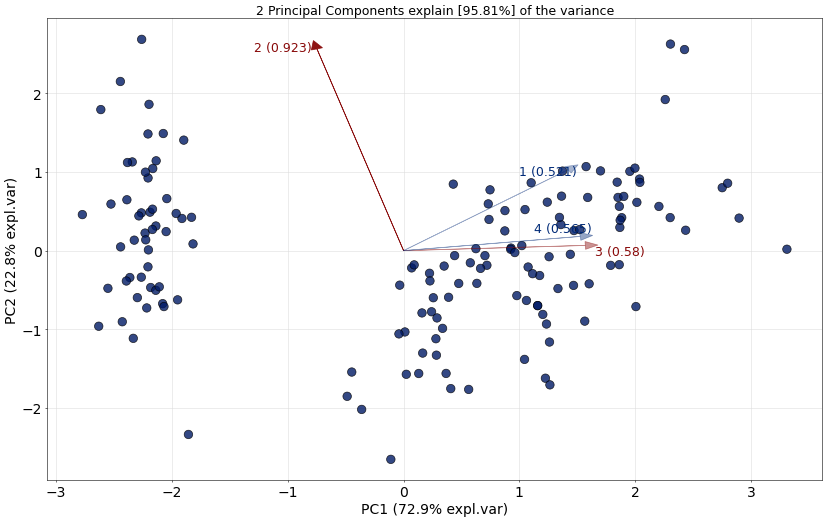

In [10]:
fig, ax = pca1.biplot(legend=False, figsize=(20, 12), dpi=50, cmap='Set1');

In [122]:
pca2 = pca(n_components=3, normalize=True)

In [123]:
model2 = pca2.fit_transform(X)

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed on the [4] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 with loadings.


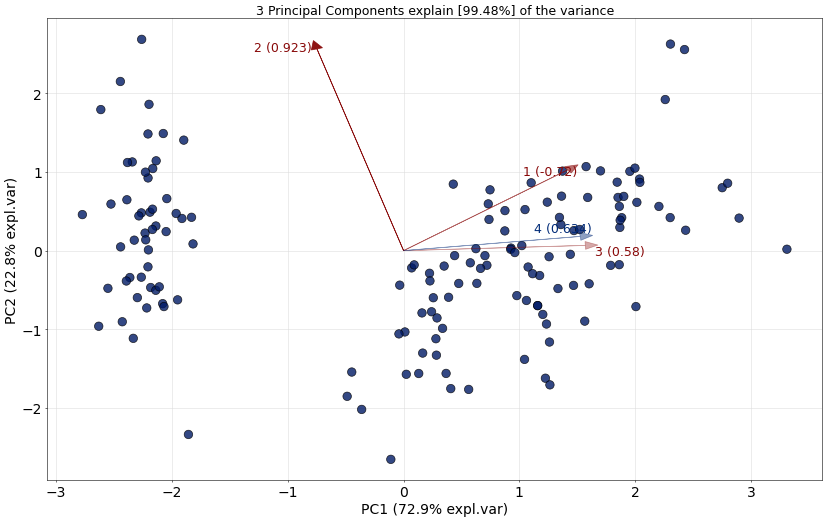

In [125]:
fig, ax = pca2.biplot(legend=False, figsize=(20, 12), dpi=50, cmap='Set1');

In [126]:
pca3 = pca(n_components=2, normalize=False)

In [127]:
model3 = pca3.fit_transform(X)

[pca] >Column labels are auto-completed.
[pca] >Row labels are auto-completed.
[pca] >The PCA reduction is performed on the [4] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 with loadings.


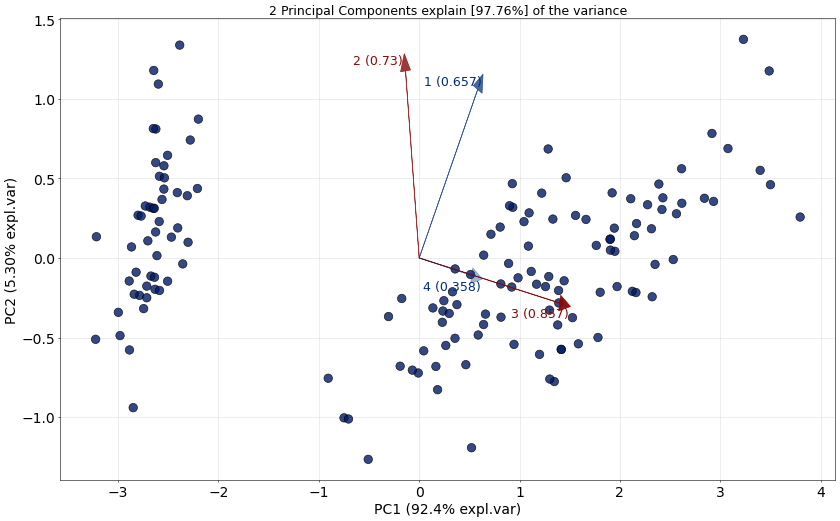

In [128]:
fig, ax = pca3.biplot(legend=False, figsize=(20, 12), dpi=50, cmap='Set1');

Aqui ya vemos la influencia de normalizar las variables antes de realizar el pca. En este caso, cuando no normalizamos obtiene la mayor información con tan solo una dimensión, lo que quiere decir que es capaz de captar más varianza en algunas de las variables, siendo esta no proporcional con el resto.

In [3]:
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.colors import ListedColormap

matplotlib.style.use('ggplot')

In [203]:
def plotDecisionBoundary(model, X, y, colors, padding=0.6, resolution = 0.0025):
    
  fig = plt.figure(figsize=(8,6))
  ax = fig.add_subplot(111)


  # Calculate the boundaries
  x_min, x_max = X[:, 0].min(), X[:, 0].max()
  y_min, y_max = X[:, 1].min(), X[:, 1].max()
  x_range = x_max - x_min
  y_range = y_max - y_min
  x_min -= x_range * padding
  y_min -= y_range * padding
  x_max += x_range * padding
  y_max += y_range * padding


  # Create a 2D Grid Matrix. The values stored in the matrix
  # are the predictions of the class at at said location
  xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                       np.arange(y_min, y_max, resolution))

  # What class does the classifier say?
  Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
  Z = Z.reshape(xx.shape)
  Z=np.array(Z, dtype=float)

  # Plot the contour map using the rainbow colourmap
  #cs = plt.contourf(xx, yy, Z, cmap=plt.cm.rainbow)
  ax.contourf(xx, yy, Z, cmap=plt.cm.rainbow)
  fig.tight_layout(pad=2)

  # Plot the testing original points as well...
  for label in np.unique(y):
    indices = np.where(y == label)
    ax.scatter(X[indices, 0], X[indices, 1], c=colors[label], alpha=0.8)

  # print the title
  p = model.get_params()
  fig.suptitle('Decision boundaries, K = ' + str(p['n_neighbors']))

In [148]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1 , random_state=1)


In [137]:
from sklearn import preprocessing

normaliser = preprocessing.Normalizer().fit(X_train)

In [155]:
X_train_normalised = normaliser.transform(X_train)
X_train = pd.DataFrame(X_train_normalised)

X_test_normalised = normaliser.transform(X_test)
X_test = pd.DataFrame(X_test_normalised)

In [157]:
from sklearn.decomposition import PCA


pca_reducer = PCA(n_components=2).fit(X_train_normalised)

X_train_pca1 = pca_reducer.transform(X_train_normalised)
X_test_pca1 = pca_reducer.transform(X_test_normalised)

In [158]:
pca_reducer = PCA(n_components=3).fit(X_train_normalised)

X_train_pca2 = pca_reducer.transform(X_train_normalised)
X_test_pca2 = pca_reducer.transform(X_test_normalised)

In [214]:
inicio = time.time()

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_pca1, y_train)

fin = time.time()
print(fin-inicio)

0.0


In [215]:
print(knn.score(X_train_pca1, y_train))
print(knn.score(X_test_pca1, y_test))

0.9851851851851852
1.0


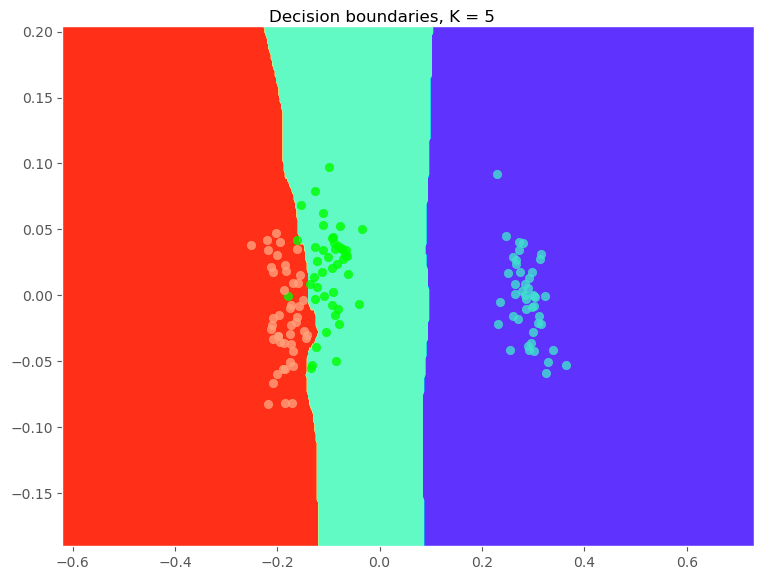

In [216]:
myColours = ['turquoise','lime','lightsalmon']

plotDecisionBoundary(knn, X_train_pca1, y_train, colors =  myColours)

In [217]:
inicio = time.time()

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_pca2, y_train)

fin = time.time()
print(fin-inicio)

0.008004188537597656


In [218]:
print(knn.score(X_train_pca2, y_train))
print(knn.score(X_test_pca2, y_test))

0.9851851851851852
0.9333333333333333


In [199]:
inicio = time.time()

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

fin = time.time()
print(fin-inicio)

0.0030107498168945312


In [173]:
print(knn.score(X_train, y_train))
print(knn.score(X_test, y_test))

0.9851851851851852
0.9333333333333333


Obtenemos que los score de train son los mismos para todos los modelos, mientras que el test mejora cuando tenemos tan solo 2 dimensiones. En el caso de la comparación entre el modelo sin reducción y el resto, solo hay diferencia cuando reducimos a 2 dimensiones, esto se debe a que con reducir a dos dimensiones ya conseguimos explicar un 94% de la variabilidad, con la tercera dimension se consigue explicar más, y esto hace que se ajuste un poco más a los datos de entrenamiento, que no se ve reflejado en los datos de entrenamiento, pero esa pequeña diferencia se nota en los de prueba, y ya sin reducir dimensionalidad no existe diferencia ya que no es capaz de explicar más varianza. 
Pero lo más destacable es que cuando reducimos la dimensionalidad también se reduce el tiempo de computación. Tras varias repeticiones, se puede ver que de pasar a tener 4 características a 3 dimensiones reduce el tiempo de computación alrededor de un 30%, e incluso un 50% al pasar a 2 dimensiones. Por tanto merece la pena reducir la dimensionalidad en este caso.
Y vemos como en el gráfico de boondaries decission obtenemos una separación muy clara y buena de los datos con 2 dimensiones, el mejor de los escenarios.

### Pregunta 3

Utiliza Árboles de Decisión para graficar los parámetros más importantes del dataset escogido. Crea distintos árboles modificando los parámetros de modelo más importantes (como p.e. el max_depth, min_samples_leaf... y otros)

Graficar los resultados de al menos 4 árboles, optimizando distintos tipos de parámetros

In [30]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree

In [32]:
digits = datasets.load_digits()

In [33]:
ext_target = digits.target[:, None]
X = pd.DataFrame(
    np.concatenate((digits.data, ext_target, digits.target_names[ext_target]), axis=1),
    columns=digits.feature_names + ['target_label', 'target_name'],
)
X

,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,pixel_0_4,pixel_0_5,pixel_0_6,pixel_0_7,pixel_1_0,pixel_1_1,...,pixel_7_0,pixel_7_1,pixel_7_2,pixel_7_3,pixel_7_4,pixel_7_5,pixel_7_6,pixel_7_7,target_label,target_name
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0,1.0,1.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0,2.0,2.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0,3.0,3.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1792,0.0,0.0,4.0,10.0,13.0,6.0,0.0,0.0,0.0,1.0,...,0.0,0.0,2.0,14.0,15.0,9.0,0.0,0.0,9.0,9.0
1793,0.0,0.0,6.0,16.0,13.0,11.0,1.0,0.0,0.0,0.0,...,0.0,0.0,6.0,16.0,14.0,6.0,0.0,0.0,0.0,0.0
1794,0.0,0.0,1.0,11.0,15.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2.0,9.0,13.0,6.0,0.0,0.0,8.0,8.0
1795,0.0,0.0,2.0,10.0,7.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,5.0,12.0,16.0,12.0,0.0,0.0,9.0,9.0


In [34]:
X.isna().sum().sum()

0

In [35]:
y = X.target_label.copy()
X.drop(["target_label", "target_name"], axis=1, inplace=True)

In [36]:
y = y.astype("category").cat.codes

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [38]:
clf = DecisionTreeClassifier().fit(X_train, y_train)

print('Accuracy of Decision Tree classifier on training set: {:.2f}'
     .format(clf.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}'
     .format(clf.score(X_test, y_test)))

Accuracy of Decision Tree classifier on training set: 1.00
Accuracy of Decision Tree classifier on test set: 0.87


In [39]:
for name, score in zip(X.columns, clf.feature_importances_):
    print(name,score)

pixel_0_0 0.0
pixel_0_1 0.001387502781185975
pixel_0_2 0.00508751019768191
pixel_0_3 0.0008250016536781475
pixel_0_4 0.0005331643340096885
pixel_0_5 0.05020403833251338
pixel_0_6 0.002461804934575592
pixel_0_7 0.0
pixel_1_0 0.0
pixel_1_1 0.0
pixel_1_2 0.016126257362974378
pixel_1_3 0.0035750071659386394
pixel_1_4 0.014845029756184363
pixel_1_5 0.008199219190866027
pixel_1_6 0.011414156866084402
pixel_1_7 0.0
pixel_2_0 0.0
pixel_2_1 0.0
pixel_2_2 0.015815238180220247
pixel_2_3 0.03199892633374488
pixel_2_4 0.040912290227613606
pixel_2_5 0.08685248467242608
pixel_2_6 0.0008250016536781475
pixel_2_7 0.001540003086865876
pixel_3_0 0.0016348656623346796
pixel_3_1 0.001624222005678853
pixel_3_2 0.09056043261618406
pixel_3_3 0.054428897727506344
pixel_3_4 0.010000208014885199
pixel_3_5 0.0030250060634865413
pixel_3_6 0.0
pixel_3_7 0.0
pixel_4_0 0.0
pixel_4_1 0.05438761984672803
pixel_4_2 0.007481841188471968
pixel_4_3 0.004392687376369862
pixel_4_4 0.069184747182437
pixel_4_5 0.03919910751347

In [40]:
# para ordenarlos

res = pd.DataFrame(sorted(zip(map(lambda x: round(x, 4), clf.feature_importances_), X.columns), 
             reverse=True),)
res.columns = ['Importance', 'Feature']

print(res)

    Importance    Feature
0       0.1236  pixel_5_2
1       0.0906  pixel_3_2
2       0.0869  pixel_2_5
3       0.0692  pixel_4_4
4       0.0544  pixel_4_1
..         ...        ...
59      0.0000  pixel_1_7
60      0.0000  pixel_1_1
61      0.0000  pixel_1_0
62      0.0000  pixel_0_7
63      0.0000  pixel_0_0

[64 rows x 2 columns]


Text(0.5, 1.0, 'Importancia de las características ')

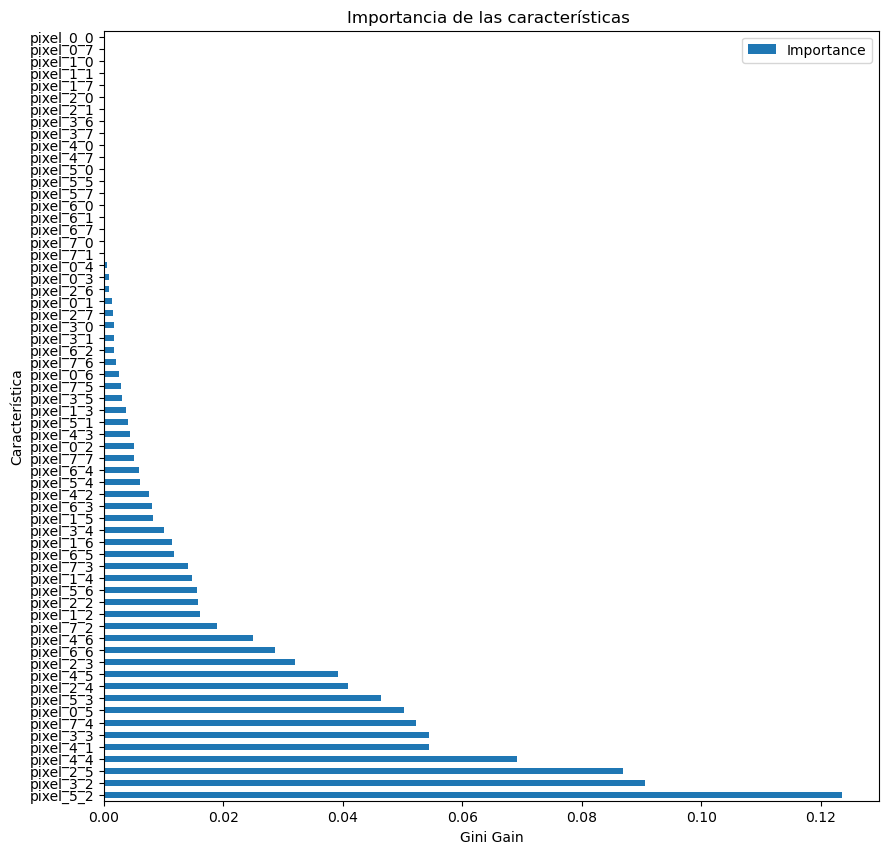

In [41]:
from matplotlib import pyplot as plt

%matplotlib inline

plt.rcParams["figure.figsize"]=10,10
res.plot.barh(x='Feature')
plt.xlabel("Gini Gain")
plt.ylabel("Característica")
plt.title("Importancia de las características ")

Vemos que se han organizado los pixeles (features) por importancia en el modelo de clasificación. La lógica nos llevaría a pensar que al estar tratándose de identificación de dígitos según una imagen por píxeles, los valores de las esquinas y alrededor normalmente son 0, ya que el dígito esta centrado en la imagen. Por tanto estas esquinas (pixel 0_0, pixel 0_7, pixel 7_0, pixel 7_7) y sus cercanos son los que menos importancia tienen para el modelo, como podemos ver reflejado en el gráfico anterior, mientras que los valores más centrados en la imagen son los que más importancia tienen.

In [42]:
model = DecisionTreeClassifier().fit(X_train, y_train)

print('Accuracy of Decision Tree classifier on training set: {:.2f}'
     .format(model.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}'
     .format(model.score(X_test, y_test)))

Accuracy of Decision Tree classifier on training set: 1.00
Accuracy of Decision Tree classifier on test set: 0.86


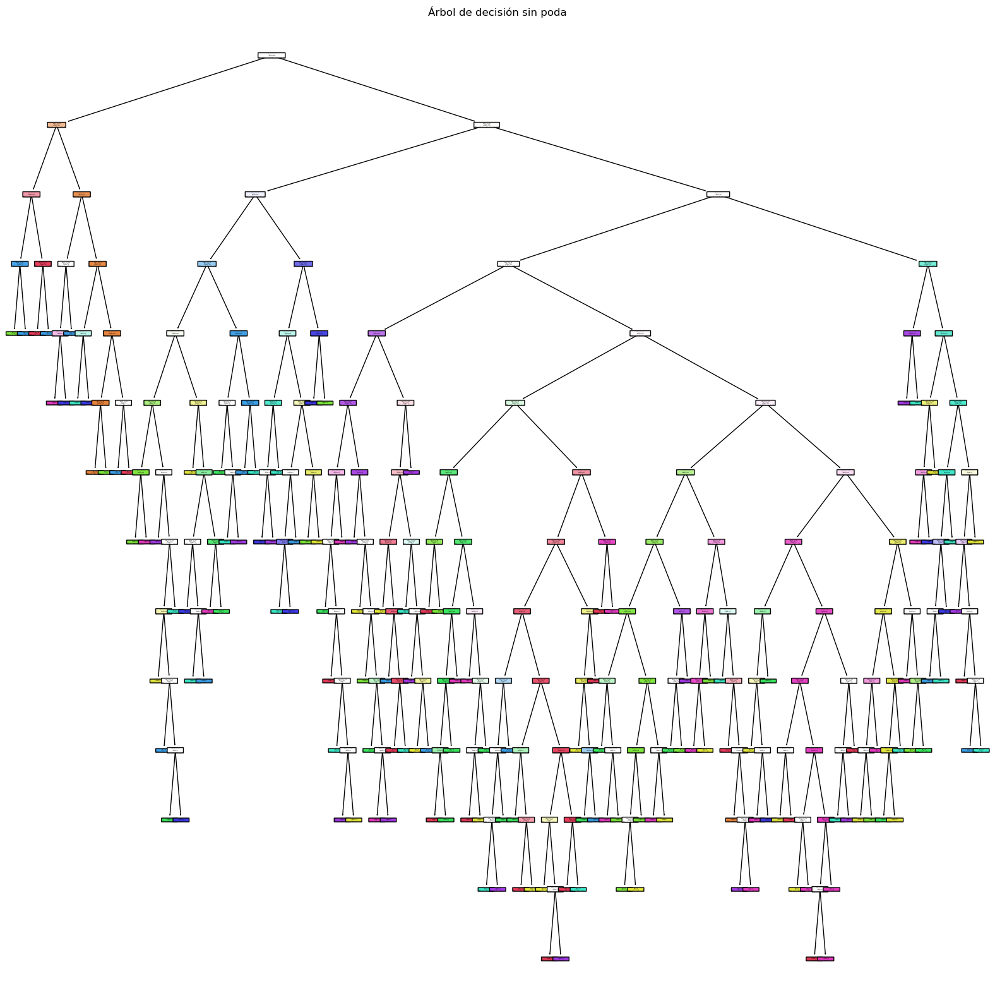

In [43]:
plt.figure(figsize = (20, 20))
dec_tree = plot_tree(decision_tree=model, feature_names = X.columns, 
                     class_names =["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"] , filled = True , precision = 4, rounded = True)

plt.title("Árbol de decisión sin poda")

plt.savefig("one.png")

Viendo como se extiende el árbol sin nigún tipo de límite o poda, vamos a considerar hacerlas (al menos para conseguir que sea más visible)

In [44]:
model1 = DecisionTreeClassifier(min_samples_split=50, random_state= 0).fit(X_train, y_train)

print('Accuracy of Decision Tree classifier on training set: {:.2f}'
     .format(model1.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}'
     .format(model1.score(X_test, y_test)))

Accuracy of Decision Tree classifier on training set: 0.88
Accuracy of Decision Tree classifier on test set: 0.83


Text(0.5, 1.0, 'Árbol de decisión (min_samples_split=50)')

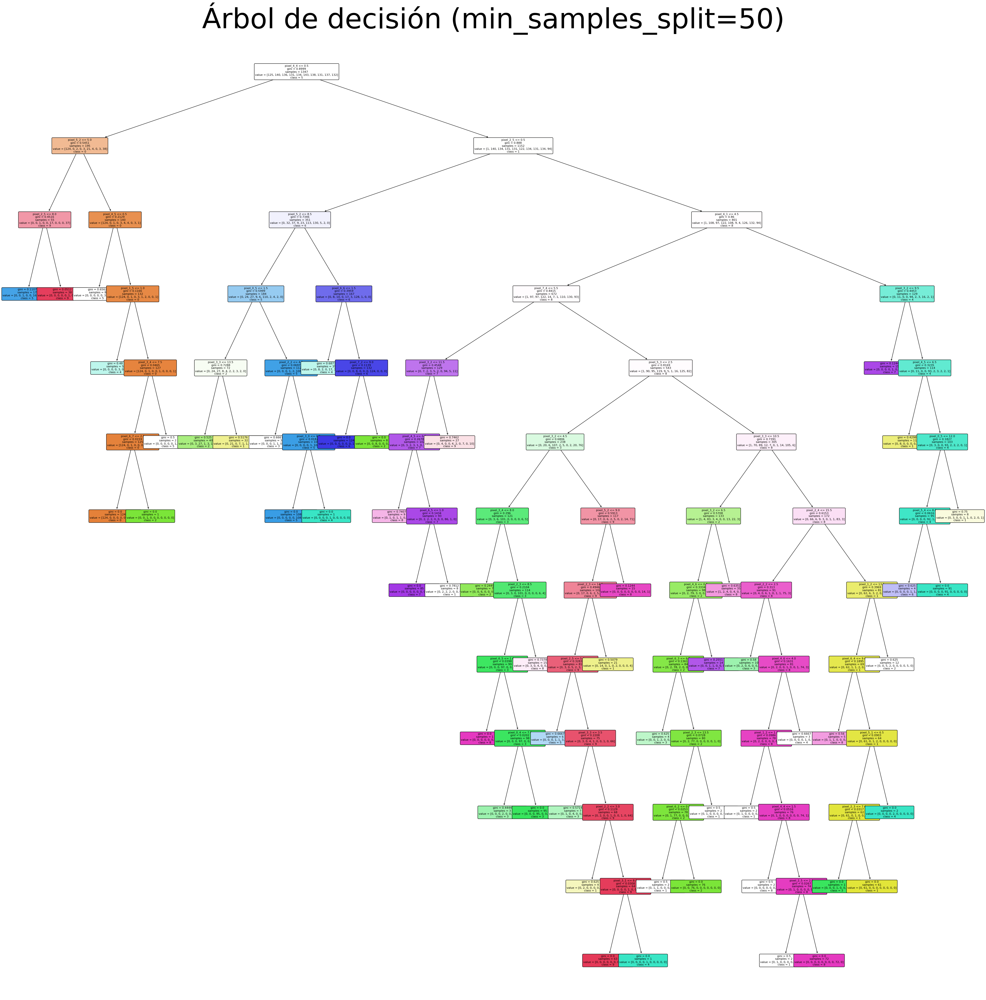

In [49]:
plt.figure(figsize = (50, 50))
dec_tree = plot_tree(decision_tree=model1, feature_names = X.columns, 
                     class_names =["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"] , filled = True , precision = 4, rounded = True, fontsize=8)

plt.title("Árbol de decisión (min_samples_split=50)", fontsize=80)


In [51]:
model2 = DecisionTreeClassifier(max_depth=6, random_state=0).fit(X_train, y_train)

print('Accuracy of Decision Tree classifier on training set: {:.2f}'
     .format(model2.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}'
     .format(model2.score(X_test, y_test)))

Accuracy of Decision Tree classifier on training set: 0.81
Accuracy of Decision Tree classifier on test set: 0.77


Text(0.5, 1.0, 'Árbol de decisión (max_depth=6)')

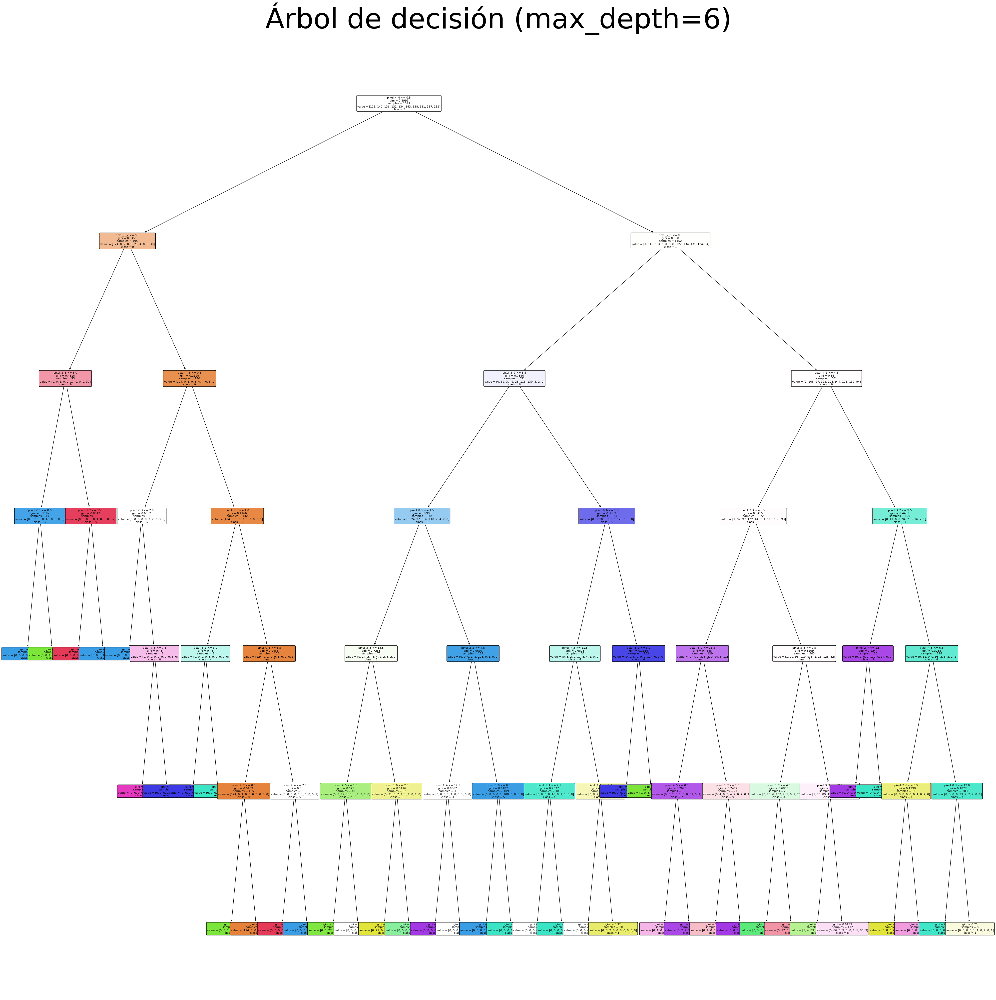

In [52]:
plt.figure(figsize = (50, 50))
dec_tree = plot_tree(decision_tree=model2, feature_names = X.columns, 
                     class_names =["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"] , filled = True , precision = 4, rounded = True, fontsize=8)

plt.title("Árbol de decisión (max_depth=6)", fontsize=80)


In [53]:
model3 = DecisionTreeClassifier(min_samples_leaf=30, random_state=None).fit(X_train, y_train)

print('Accuracy of Decision Tree classifier on training set: {:.2f}'
     .format(model3.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}'
     .format(model3.score(X_test, y_test)))

Accuracy of Decision Tree classifier on training set: 0.79
Accuracy of Decision Tree classifier on test set: 0.79


Text(0.5, 1.0, 'Árbol de decisión (min_samples_leaf=30)')

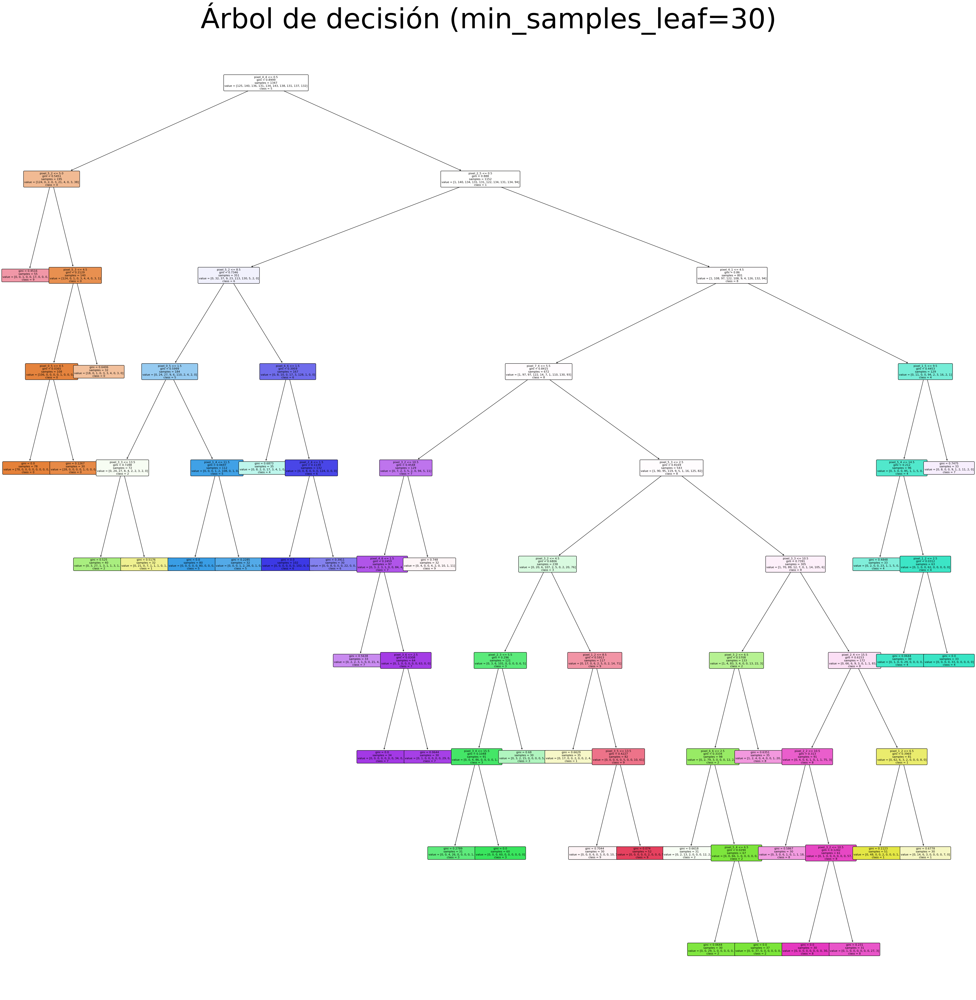

In [54]:
plt.figure(figsize = (50, 50))
dec_tree = plot_tree(decision_tree=model3, feature_names = X.columns, 
                     class_names =["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"] , filled = True , precision = 4, rounded = True, fontsize=8)
plt.title("Árbol de decisión (min_samples_leaf=30)", fontsize=80)


In [56]:
model4 = DecisionTreeClassifier(max_depth=7,
                                min_samples_split=2,
                                min_samples_leaf=8, 
                                random_state=0).fit(X_train, y_train)

print('Accuracy of Decision Tree classifier on training set: {:.2f}'
     .format(model4.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}'
     .format(model4.score(X_test, y_test)))

Accuracy of Decision Tree classifier on training set: 0.85
Accuracy of Decision Tree classifier on test set: 0.83


Text(0.5, 1.0, 'Árbol de decisión (max_depth=7, min_samples_split=2, min_samples_leaf=8)')

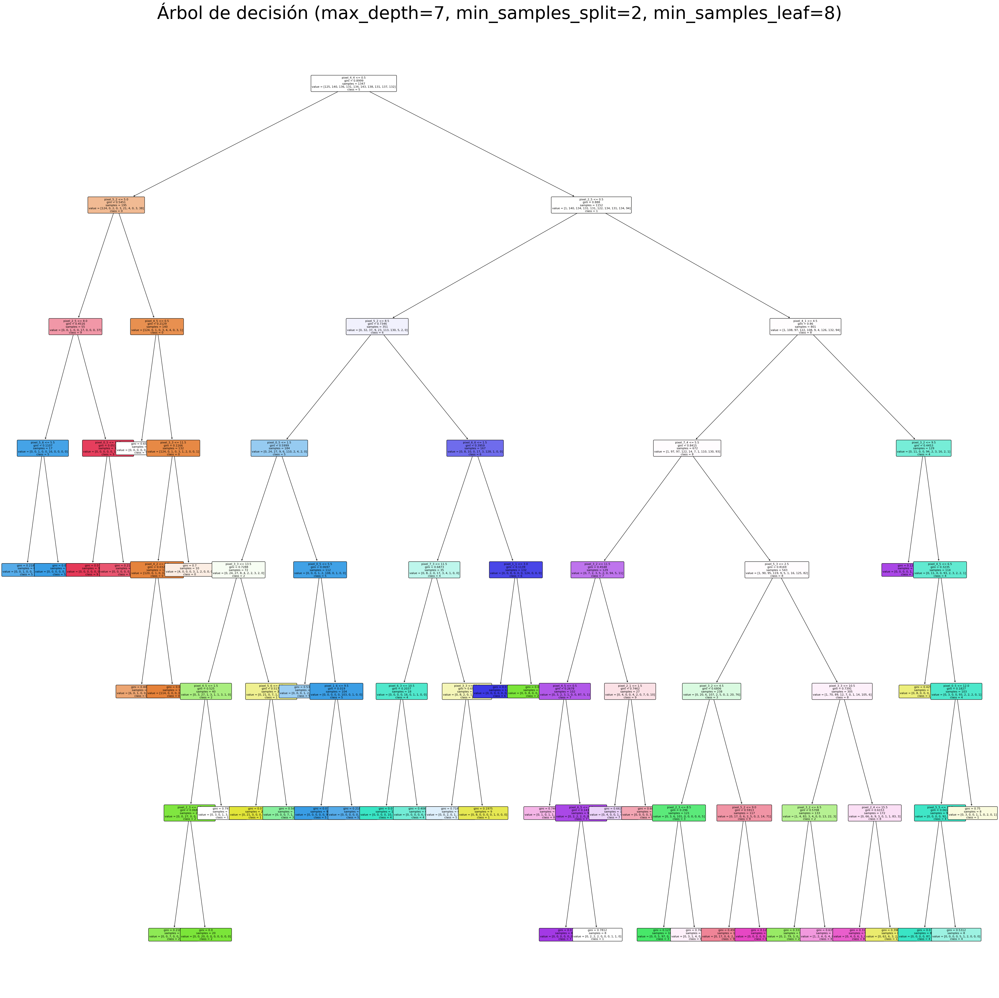

In [58]:
plt.figure(figsize = (50, 50))
dec_tree = plot_tree(decision_tree=model4, feature_names = X.columns, 
                     class_names =["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"] , filled = True , precision = 4, rounded = True, fontsize=8)

plt.title("Árbol de decisión (max_depth=7, min_samples_split=2, min_samples_leaf=8)", fontsize=50)


Tras mucho modificar y variar los hiperparámetros, Hemos llegado al punto óptimo donde se encuentran más cercano los accuracy de train y test en los hiperparámetros del model4. Consiguiendo un accuracy de 0.85 en train y 0.83 en test. A partir de aquí el accuracy de test apenas sube, por lo que no podemos generalizar más con nuestro modelo. Si hacemos el modelo más complejo solo conseguimos mejor accuracy en train, lo que significaría sobreajustar el modelo.

## Conjunto 2

El fichero datos_pago_microcreditos.csv contiene 30000 transacciones bancarias relativas al pago o impago de microcreditos. El dataset consta de 62 dimensiones propietarias de las cuales el banco no ha proporcionado informacion por confidencialidad, a parte de su valor. La matriz de entrada se encuentra en x_train, e y_train contiene la etiqueta relativa a esa transaccion, un 1 indica que si se pagó el microcredito y un 0 que no se pagó.

Considera que el tamaño del dataset es lo suficientemente grande como para, dependiendo de los recursos de la maquina, poder tardar varias horas en entrenar modelos complejos. Usando verbose=4 durante el fit para la optimización de parámetros podras ver el tiempo que tarda cada fit. El valor del parámetro "verbose" es un número entero que indica el nivel de detalle de la información que se desea mostrar durante el entrenamiento del modelo.

Ejecuta el código inicial para estandarizar los datos y contesta las siguientes preguntas.

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

In [2]:
data_file='datos_pago_microcreditos.csv'

pdl=pd.read_csv(data_file)

In [3]:
pdl["payment"]=np.where(pdl["payment"]=="Success",1,0)

k=pdl.columns

for col in k:
    if pdl[col].dtype=='object':
        temp=pd.get_dummies(pdl[col],drop_first=True,prefix=col)
        pdl=pd.concat([pdl,temp],axis=1)
        pdl.drop([col],axis=1,inplace=True)


pdl.dropna(axis=0,inplace=True)


In [4]:
pdl_train, pdl_test = train_test_split(pdl, test_size = 0.2,random_state=2)

#x_train=pdl_train.drop(["payment"],1)
X_train=pdl_train.drop(columns="payment")
y_train=pdl_train["payment"]

#x_test=pdl_test.drop(["payment"],1)
X_test=pdl_test.drop(columns="payment")
y_test=pdl_test["payment"]

X_train.reset_index(drop=True,inplace=True)
y_train.reset_index(drop=True,inplace=True)

In [9]:
X_train.isna().sum().sum()

0

In [10]:
y_train

0        0
1        1
2        0
3        0
4        1
        ..
23995    0
23996    1
23997    0
23998    0
23999    1
Name: payment, Length: 24000, dtype: int32

In [27]:
sum(y_train==0)


14993

In [11]:
sum(y_train==1)

9007

In [12]:
sum(y_test==0)

3762

In [13]:
sum(y_test==1)

2238

### Pregunta 4

Usando RandomSearchCV, identifica para un clasificador K-NN el numero de vecinos entre 1 y 30 que optimiza el resultado usando como scoring de la optimizacion el area bajo la curva (roc_auc) y con 10 folds para la validacion cruzada. Presenta los parametros optimos y evalúa el clasificador optimo con esos parámetros.

In [5]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from sklearn.neighbors import KNeighborsClassifier
import time


In [6]:
from sklearn.preprocessing import Normalizer
from sklearn.decomposition import PCA

In [7]:
normaliser = Normalizer().fit(X_train)

X_train_normalised = normaliser.transform(X_train)
X_train = pd.DataFrame(X_train_normalised)

X_test_normalised = normaliser.transform(X_test)
X_test = pd.DataFrame(X_test_normalised)

In [8]:
from pca import pca

In [9]:
# Initialize
model = pca(n_components=15)
# Fit using PCA
results = model.fit_transform(X_train)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed on the [62] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[15]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


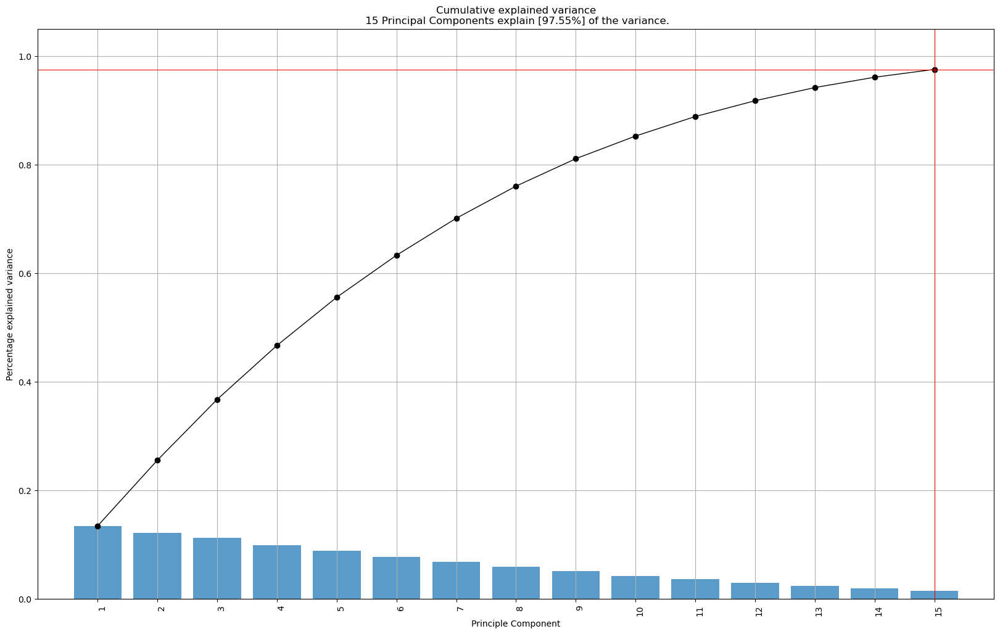

In [10]:
fig, ax = model.plot(figsize=(20, 12))

In [11]:
pca_reducer = PCA(n_components=11).fit(X_train)

X_train_pca = pca_reducer.transform(X_train_normalised)
X_test_pca = pca_reducer.transform(X_test_normalised)

Debido a que tenemos muchas variables y computacionalmente se hace muy pesado, vamos a reducir el número de componenetes a 11, con los cuales ya obtenemos una varianza explicada del 90%.

In [12]:
parametros =[
    {'n_neighbors': randint(1, 30), 
     'weights':['uniform', 'distance'],
     },
]

modelo = KNeighborsClassifier()

search = RandomizedSearchCV(modelo, parametros, cv=10, verbose=4, random_state=0,
                          scoring='roc_auc',n_jobs=5, n_iter=50)


search.fit(X_train_pca, y_train)

Fitting 10 folds for each of 50 candidates, totalling 500 fits


RandomizedSearchCV(cv=10, estimator=KNeighborsClassifier(), n_iter=50, n_jobs=5,
                   param_distributions=[{'n_neighbors': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x0000020CCF030AD0>,
                                         'weights': ['uniform', 'distance']}],
                   random_state=0, scoring='roc_auc', verbose=4)

In [13]:
search.best_params_

{'n_neighbors': 27, 'weights': 'distance'}

In [14]:
search.best_score_

0.7663256629050436

In [15]:
print(search.score(X_train_pca, y_train))
print(search.score(X_test_pca, y_test))

1.0
0.774312429596753


Vemos que el modelo obtiene un 100% de acierto en la clasificación con los datos de entrenamiento, mientras que en los datos de test se obtiene en torno a un 77%. Esto puede indicar posibles problemas de sobreajuste del modelo.

### Pregunta 5

Obten la matriz de confusión del clasificador optimo anterior. ¿cómo lees cada uno de los valores?¿qué valor de precision y recall tiene el clasificador optimizado con roc_auc?

In [16]:
from sklearn.metrics import confusion_matrix

search_predicted = search.predict(X_test_pca)
confusion = confusion_matrix(y_test, search_predicted)

print('KNN classifier (n_neighbors: 27, weights: distance)\n', confusion)

KNN classifier (n_neighbors: 27, weights: distance)
 [[3449  313]
 [1415  823]]


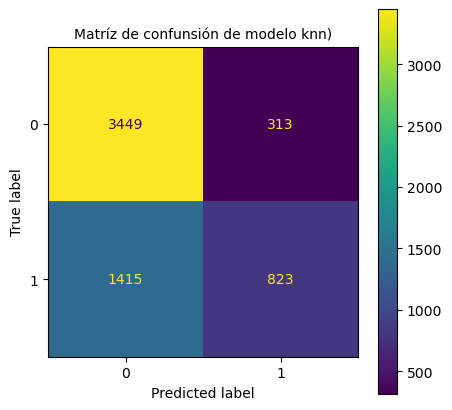

In [68]:
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot()

plt.title("Matríz de confunsión de modelo knn)", fontsize=10)

plt.show()

Así no podríamos saber a que grupo pertenece cada valor, pero sabiendo que el tamaño de 0 es mayor que 1 en todo el dataset y que están proporcionados, podemos afirmar que se trata del grupo 0 la esquina superior izquierda, lo que se considera verdaderos positivos. Vemos por tanto que acierta bastante en cuanto a la clasificación de 0 pero no tanto en la clasificación de 1. 

Tenemos en total 3762 casos positivos en los datos de test.
- 3449 son los verdaderos positivos, clasificados como 0
- 313 son los falsos negativos, clasificados como 1 (negativos) pero que realmente son 0 (positivos)

Tenemos en total 2238 casos negativos en los datos de test.
- 823 son los verdaderos negativos, clasificados como 1
- 1415 son los falsos positivos, clasificados como 0 (positivos) pero que realmente son 1 (negativos)

Vemos que falla más que acierta en los casos negativos.

In [55]:
from sklearn.metrics import classification_report

print(classification_report(y_test, search_predicted))

              precision    recall  f1-score   support

           0       0.71      0.92      0.80      3762
           1       0.72      0.37      0.49      2238

    accuracy                           0.71      6000
   macro avg       0.72      0.64      0.64      6000
weighted avg       0.71      0.71      0.68      6000



La precisión se calcula como el cociente de verdaderos positivos entre la suma de verdaderos positivos y falsos positivos, es decir los verdaderamente positivos entre todos los que se han clasificado positivos, y de la misma manera para el otro grupo, que serían los negativos. En nuestro caso obtenemos valores similares para ambos grupos. 

El recall sin embargo es el cociente de verdaderos positivos entre la suma de verdaderos positivos y falsos negativos, es decir los verdaderamente positivos entre todos los que realmente son positivos, y de la misma manera para el otro grupo, que serían los negativos. En nuestro caso obtenemos valores significativamente diferentes ya que los falsos negativos son mucho más grande en el grupo 1 que en el 0. 

### Pregunta 6

Identifica para el mismo problema los valores optimos de un clasificador SVC que use el kernel rbf usando el area bajo la curva como métrica. Ten en cuenta que hacer el fit de cada fold de SVC es mucho mas costoso computacionalmente que con KNN.

In [16]:
from sklearn.svm import SVC
import numpy as np

parametros =[
    {'C': randint(1, 20), 
     'kernel': ['rbf'],
    },
]

modelo_SVM = SVC()

search_svc = RandomizedSearchCV(modelo_SVM, parametros, cv=10, verbose=4, random_state=0,
                          scoring='roc_auc',n_jobs=5, n_iter=50)


search_svc.fit(X_train_pca, y_train)

Fitting 10 folds for each of 50 candidates, totalling 500 fits


RandomizedSearchCV(cv=10, estimator=SVC(), n_iter=50, n_jobs=5,
                   param_distributions=[{'C': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x0000013674730550>,
                                         'kernel': ['rbf']}],
                   random_state=0, scoring='roc_auc', verbose=4)

In [17]:
search_svc.best_params_

{'C': 1, 'kernel': 'rbf'}

In [18]:
search_svc.get_params

<bound method BaseEstimator.get_params of RandomizedSearchCV(cv=10, estimator=SVC(), n_iter=50, n_jobs=5,
                   param_distributions=[{'C': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x0000013674730550>,
                                         'kernel': ['rbf']}],
                   random_state=0, scoring='roc_auc', verbose=4)>

In [21]:
print(search_svc.score(X_train_pca, y_train))
print(search_svc.score(X_test_pca, y_test))

0.8407474948284774
0.8204543197840786


Obtenemos mejores resultados que en knn, los resultados de train y test son muy parecidos lo que nos indica que no hay sobreajuste.

### Pregunta 7

GradientBoostingClasifier es uno de los métodos de scikitlearn que suele producir resultados bastante adecuados. Implementa un clasificador utilizando GradientBoostingClasifier considerando 0.05, 0.1, 0.15, 0.2, 0.25, 0.3 como learning rate.¿qué learning rate produce un resultado optimo usando roc_auc?

In [45]:
from sklearn.ensemble import GradientBoostingClassifier

In [61]:
cl1 = GradientBoostingClassifier(max_depth=5, learning_rate=0.05, warm_start=True, verbose=4)
cl1.fit(X_train_pca, y_train)
print(cl1.score(X_train_pca, y_train))
print(cl1.score(X_test_pca, y_test))

      Iter       Train Loss   Remaining Time 
         1           1.2970           41.02s
         2           1.2731           41.69s
         3           1.2514           40.34s
         4           1.2318           39.14s
         5           1.2140           39.05s
         6           1.1978           38.98s
         7           1.1829           38.97s
         8           1.1694           38.51s
         9           1.1568           38.05s
        10           1.1453           37.69s
        11           1.1346           37.12s
        12           1.1247           36.52s
        13           1.1155           36.11s
        14           1.1072           35.69s
        15           1.0994           35.12s
        16           1.0923           34.78s
        17           1.0857           34.33s
        18           1.0795           33.88s
        19           1.0739           33.60s
        20           1.0684           33.41s
        21           1.0635           33.19s
        2

In [62]:
cl2 = GradientBoostingClassifier(max_depth=5, learning_rate=0.1, warm_start=True, verbose=4)
cl2.fit(X_train_pca, y_train)
print(cl2.score(X_train_pca, y_train))
print(cl2.score(X_test_pca, y_test))

      Iter       Train Loss   Remaining Time 
         1           1.2719           42.23s
         2           1.2299           41.40s
         3           1.1955           42.58s
         4           1.1668           43.85s
         5           1.1428           44.63s
         6           1.1226           44.84s
         7           1.1053           44.27s
         8           1.0905           43.31s
         9           1.0775           42.24s
        10           1.0666           41.35s
        11           1.0570           40.55s
        12           1.0486           39.85s
        13           1.0414           39.22s
        14           1.0352           38.51s
        15           1.0293           37.93s
        16           1.0242           37.33s
        17           1.0196           36.71s
        18           1.0157           36.12s
        19           1.0120           35.59s
        20           1.0086           35.11s
        21           1.0051           34.60s
        2

In [63]:
cl3 = GradientBoostingClassifier(max_depth=5, learning_rate=0.15, warm_start=True, verbose=4)
cl3.fit(X_train_pca, y_train)
print(cl3.score(X_train_pca, y_train))
print(cl3.score(X_test_pca, y_test))

      Iter       Train Loss   Remaining Time 
         1           1.2482           42.69s
         2           1.1930           41.04s
         3           1.1519           40.89s
         4           1.1201           40.54s
         5           1.0956           39.91s
         6           1.0758           39.41s
         7           1.0604           38.95s
         8           1.0476           38.53s
         9           1.0374           38.16s
        10           1.0286           37.64s
        11           1.0216           37.20s
        12           1.0153           36.78s
        13           1.0098           36.48s
        14           1.0050           36.48s
        15           1.0008           36.58s
        16           0.9966           36.60s
        17           0.9927           36.56s
        18           0.9893           36.31s
        19           0.9855           35.73s
        20           0.9818           35.28s
        21           0.9790           34.73s
        2

In [64]:
cl4 = GradientBoostingClassifier(max_depth=5, learning_rate=0.2, warm_start=True, verbose=4)
cl4.fit(X_train_pca, y_train)
print(cl4.score(X_train_pca, y_train))
print(cl4.score(X_test_pca, y_test))

      Iter       Train Loss   Remaining Time 
         1           1.2258           42.88s
         2           1.1615           41.07s
         3           1.1178           40.97s
         4           1.0866           40.02s
         5           1.0636           39.60s
         6           1.0464           39.17s
         7           1.0333           38.84s
         8           1.0234           38.32s
         9           1.0153           37.90s
        10           1.0085           37.49s
        11           1.0025           37.09s
        12           0.9973           36.73s
        13           0.9928           36.25s
        14           0.9883           35.81s
        15           0.9837           35.50s
        16           0.9790           35.09s
        17           0.9757           34.68s
        18           0.9726           34.24s
        19           0.9689           33.82s
        20           0.9653           33.46s
        21           0.9606           33.00s
        2

In [65]:
cl5 = GradientBoostingClassifier(max_depth=5, learning_rate=0.25, warm_start=True, verbose=4)
cl5.fit(X_train_pca, y_train)
print(cl5.score(X_train_pca, y_train))
print(cl5.score(X_test_pca, y_test))

      Iter       Train Loss   Remaining Time 
         1           1.2048           51.92s
         2           1.1350           46.96s
         3           1.0911           44.74s
         4           1.0615           43.07s
         5           1.0418           44.14s
         6           1.0276           43.66s
         7           1.0168           43.82s
         8           1.0078           43.77s
         9           1.0010           43.58s
        10           0.9945           42.54s
        11           0.9884           41.73s
        12           0.9831           40.89s
        13           0.9785           41.06s
        14           0.9744           40.51s
        15           0.9699           39.75s
        16           0.9651           39.05s
        17           0.9604           38.37s
        18           0.9567           37.71s
        19           0.9535           37.13s
        20           0.9512           36.53s
        21           0.9479           35.96s
        2

In [66]:
cl6 = GradientBoostingClassifier(max_depth=5, learning_rate=0.3, warm_start=True, verbose=4)
cl6.fit(X_train_pca, y_train)
print(cl6.score(X_train_pca, y_train))
print(cl6.score(X_test_pca, y_test))

      Iter       Train Loss   Remaining Time 
         1           1.1852           41.78s
         2           1.1124           40.97s
         3           1.0698           40.51s
         4           1.0444           40.20s
         5           1.0270           40.23s
         6           1.0152           40.95s
         7           1.0061           41.35s
         8           0.9982           41.94s
         9           0.9910           42.09s
        10           0.9842           41.54s
        11           0.9774           40.73s
        12           0.9723           40.10s
        13           0.9665           39.33s
        14           0.9614           38.70s
        15           0.9563           38.06s
        16           0.9507           37.46s
        17           0.9472           36.96s
        18           0.9428           36.41s
        19           0.9388           35.83s
        20           0.9339           35.34s
        21           0.9308           34.80s
        2

Lo unico que conseguimos aumentado el learning rate es que se sobreajuste si tenemos muchas iteraciones. Con un learning rate de 0.05 y con 100 repeticiones es suficiente para este modelo. Si aumentamos, el score de train sube pero no es capaz de generalizar mejor en test, incluso va a peor.

### Pregunta 8

Usando la matriz de confusión de los tres casos y utilizando las métricas que te parezcan oportunas ¿qué clasificador de los 3 seleccionarias y por qué?

In [67]:
from sklearn.metrics import confusion_matrix

search_predicted = search.predict(X_test_pca)
confusion_knn = confusion_matrix(y_test, search_predicted)

search_predicted_svc = search_svc.predict(X_test_pca)
confusion_svc = confusion_matrix(y_test, search_predicted_svc)

cl_predicted = cl1.predict(X_test_pca)
confusion_cl = confusion_matrix(y_test, cl_predicted)

print('KNN classifier (n_neighbors: 27, weights: distance)\n', confusion_knn)
print('SVC (C: 1, kernel: rbf)\n', confusion_svc)
print('GradientBoosting (max_depth: 5, learning_rate: 0.05, warm_start: True)\n', confusion_cl)

KNN classifier (n_neighbors: 27, weights: distance)
 [[3449  313]
 [1415  823]]
SVC (C: 1, kernel: rbf)
 [[3273  489]
 [ 925 1313]]
GradientBoosting (max_depth: 5, learning_rate: 0.05, warm_start: True)
 [[3191  571]
 [ 866 1372]]


In [17]:
search_svc.best_params_

{'C': 1, 'kernel': 'rbf'}

In [69]:
from sklearn.metrics import classification_report

print(classification_report(y_test, search_predicted))

              precision    recall  f1-score   support

           0       0.71      0.92      0.80      3762
           1       0.72      0.37      0.49      2238

    accuracy                           0.71      6000
   macro avg       0.72      0.64      0.64      6000
weighted avg       0.71      0.71      0.68      6000



In [70]:
print(classification_report(y_test, search_predicted_svc))

              precision    recall  f1-score   support

           0       0.78      0.87      0.82      3762
           1       0.73      0.59      0.65      2238

    accuracy                           0.76      6000
   macro avg       0.75      0.73      0.74      6000
weighted avg       0.76      0.76      0.76      6000



In [71]:
print(classification_report(y_test, cl_predicted))

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      3762
           1       0.71      0.61      0.66      2238

    accuracy                           0.76      6000
   macro avg       0.75      0.73      0.74      6000
weighted avg       0.76      0.76      0.76      6000



Vemos que aunque en el svc obteníamos mejores scores, al final parece que el que tiene mejores resultado final y generalización es el modelo creado con gradient boosting. 
Pero esto no sería la decisión en sí, ya que hay muy poca diferencia entre estas dos últimas mencionadas. Habría que saber que nos cuesta más si dar un crédito a alguien que no nos lo va a devolver o no dar un crédito a alguien que nos lo devolvería. Depende de lo que nos convenga más elegiríamos un modelo u otro, si queremos acertar más en 0 (no paga el crédito) elegimos el svc y de lo contrario el gradientboosting. 

## Conjunto 3

El dataset winequality-red.csv es un dataset que contiene para los vinos de la denominación de origen Minho una serie de métricas donde se caracterizan diferentes tipos de vinos. Entre estos valores se encuentran el pH, su densidad, el nivel de alcohol o su calidad (de 1 a 6). En este ejercicio usaremos este dataset para probar diferentes técnicas de clustering

In [190]:
import warnings
warnings.filterwarnings('ignore')

myfile='winequality-red.csv'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Wine=pd.read_csv(myfile,sep=";")

In [191]:
Wine

,Unnamed: 0,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


### Pregunta 9

Utilizando solo las columnas "sulphates","alcohol","pH", y usando KMeans identifica el numero optimo de clusters para el conjunto de datos utilizando la "inertia_" para medir la compacidad de los clusteres.

In [168]:
wine = Wine.loc[:,"pH":"alcohol"]

In [169]:
wine.isna().sum()

pH           0
sulphates    0
alcohol      0
dtype: int64

In [170]:
from sklearn.preprocessing import Normalizer

In [171]:
normaliser = Normalizer().fit(wine)

wine_normalised = normaliser.transform(wine)
wine = pd.DataFrame(wine_normalised)

In [172]:
wine.head()

,0,1,2
0,0.349269,0.055724,0.935364
1,0.309729,0.065817,0.948544
2,0.315023,0.062811,0.947003
3,0.306404,0.056239,0.950239
4,0.349269,0.055724,0.935364


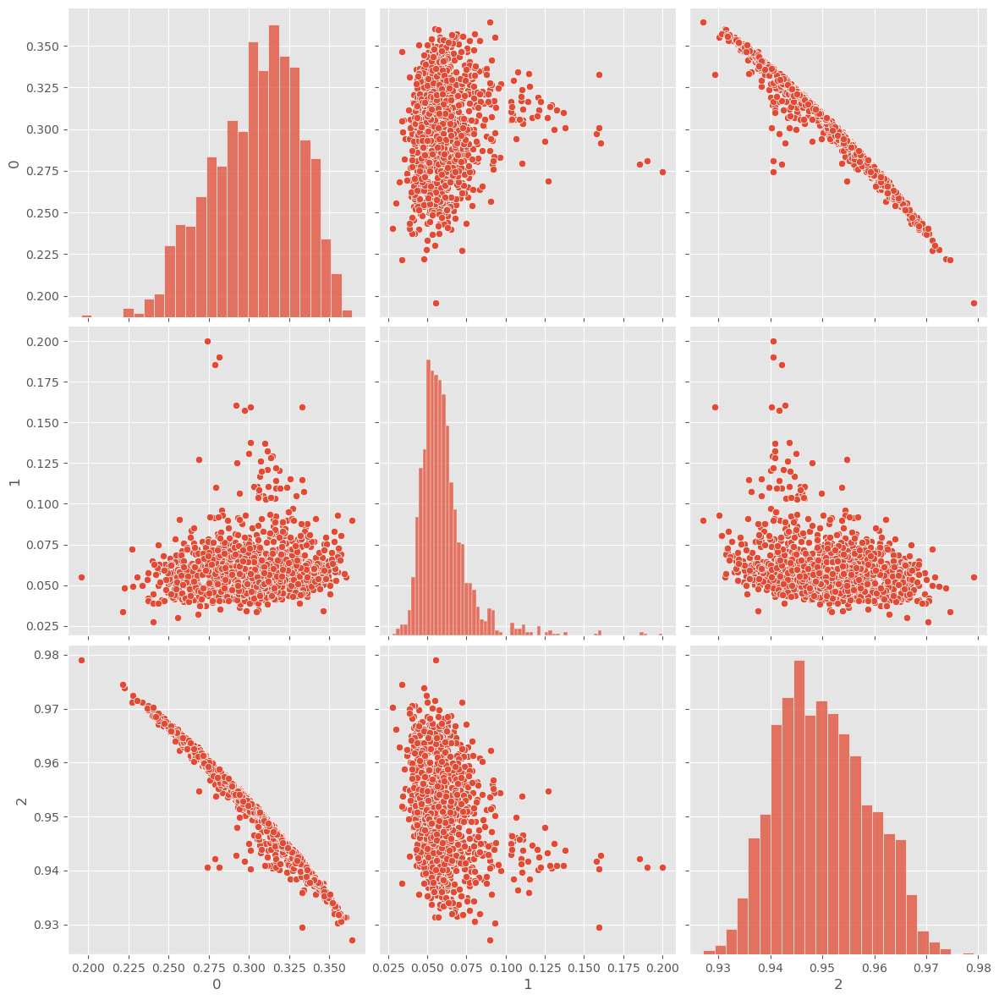

In [218]:
import seaborn as sb
sb.pairplot(wine.dropna(),size=4,vars=[0, 1, 2],kind='scatter')
plt.show()

Revisando la gráfica no parece que haya ningún tipo de agrupación, pero existe una clara correlación negativa entre el pH(0) y el alcohol(1).

In [173]:
from sklearn.cluster import KMeans

for i in range(2,9):
    kmeans = KMeans(n_clusters=i, n_init=10, random_state=42)
    kmeans.fit(wine)
    print('iteria de KMeans para', i, 'clusters:', kmeans.inertia_)

iteria de KMeans para 2 clusters: 0.840063575003269
iteria de KMeans para 3 clusters: 0.6286823427045771
iteria de KMeans para 4 clusters: 0.4283849907056006
iteria de KMeans para 5 clusters: 0.34650781229261596
iteria de KMeans para 6 clusters: 0.2959496045967489
iteria de KMeans para 7 clusters: 0.25728763834437873
iteria de KMeans para 8 clusters: 0.22501312180344196


Como estamos midiendo las distancias de los puntos a los centroides, cuanto menor sea la distancia mejor, quiere decir que está más agrupado. Por tanto el clustering que tiene mejor calidad según este criterio es la que menos inertia tiene, pero siempre va a bajar esta cifra según aumentemos los cluster, por eso en realidad debemos buscar un "codo", donde la disminución comienza a ser más estable. Es decir, buscamos reducir el valor de esta métrica pero siendo realistas en la agrupación y no crear grupos inservibles. 

Veamos mejor en un gráfico. 

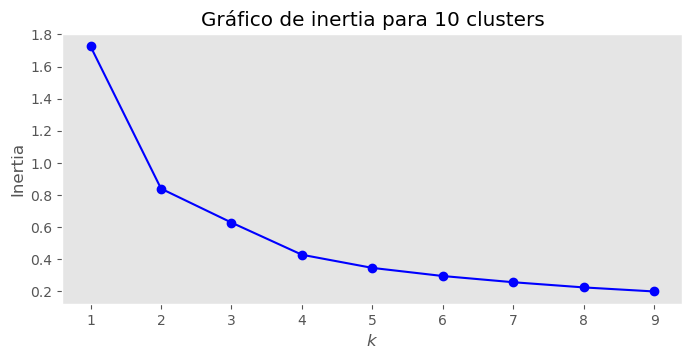

In [175]:
kmeans_per_k = [KMeans(n_clusters=k, n_init=10, random_state=42).fit(wine)
                for k in range(1, 10)]
inertias = [model.inertia_ for model in kmeans_per_k]

plt.figure(figsize=(8, 3.5))
plt.plot(range(1, 10), inertias, "bo-")
plt.xlabel("$k$")
plt.ylabel("Inertia")
plt.title('Gráfico de inertia para 10 clusters')
plt.grid()
plt.show()

Aqui vemos que el 'codo' podría situarse en 2 clusters, pero también podría ser buen agrupamiento entre 3 o 4 clusters. Debemos ver gráficamente como se han construido estos clusters.

In [159]:
X = np.array(wine)

In [160]:
kmeans_3 = KMeans(n_clusters=3, n_init=10, random_state=42).fit(X)

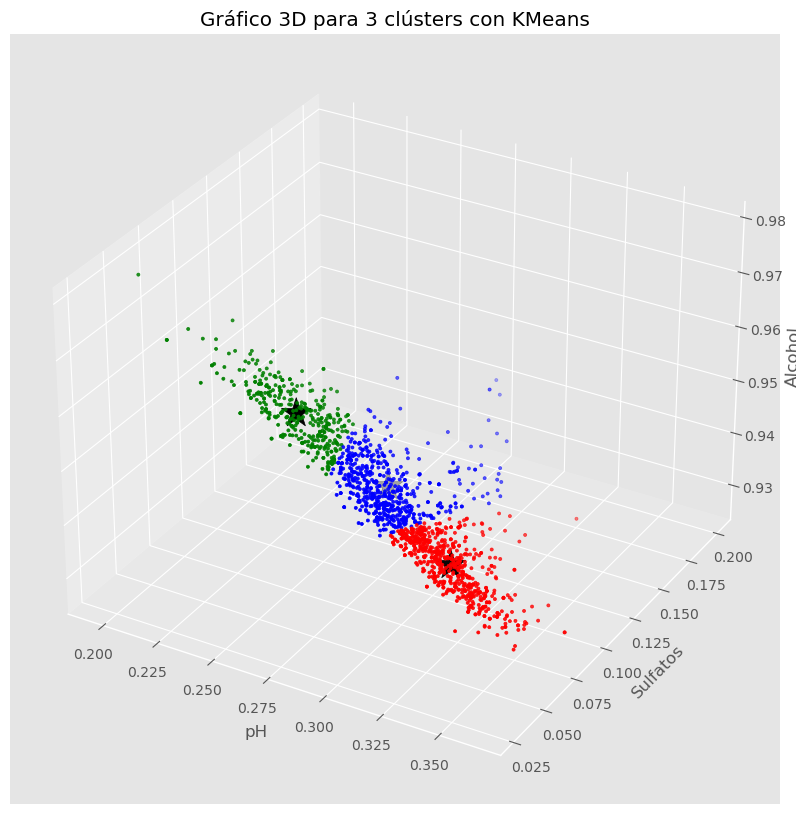

In [293]:
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['figure.figsize'] = (20, 10)
plt.style.use('ggplot')

# Predicting the clusters
labels = kmeans_3.predict(X)
# Getting the cluster centers
C = kmeans_3.cluster_centers_
colores=['red','green','blue']
asignar=[]
for row in labels:
    asignar.append(colores[row])

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=asignar,s=5)
ax.scatter(C[:, 0], C[:, 1], C[:, 2], marker='*', c= "black", s=500)
ax.set_xlabel('pH')
ax.set_ylabel('Sulfatos')
ax.set_zlabel('Alcohol')
plt.title('Gráfico 3D para 3 clústers con KMeans')

plt.show()

In [299]:
kmeans_4 = KMeans(n_clusters=4, n_init=10, random_state=42).fit(X)

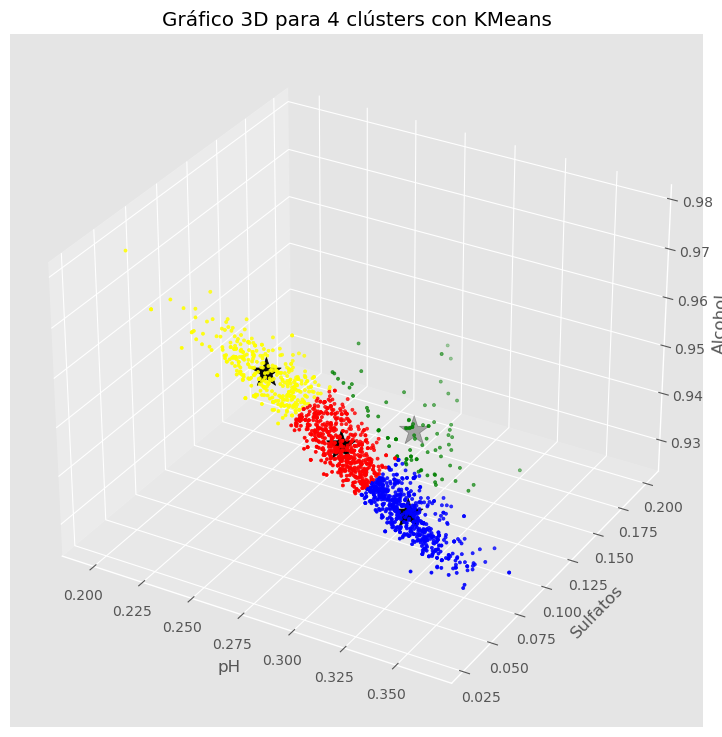

In [301]:
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['figure.figsize'] = (16, 9)
plt.style.use('ggplot')

# Predicting the clusters
labels = kmeans_4.predict(X)
# Getting the cluster centers
C = kmeans_4.cluster_centers_
colores=['red','green','blue', 'yellow']
asignar=[]
for row in labels:
    asignar.append(colores[row])

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=asignar,s=5)
ax.scatter(C[:, 0], C[:, 1], C[:, 2], marker='*', c= "black", s=500)
ax.set_xlabel('pH')
ax.set_ylabel('Sulfatos')
ax.set_zlabel('Alcohol')
plt.title('Gráfico 3D para 4 clústers con KMeans')

plt.show()

Haremos 3 gráficas en 2 dimensiones con las proyecciones a partir de nuestra gráfica 3D para que nos ayude a visualizar los grupos y su clasificación:



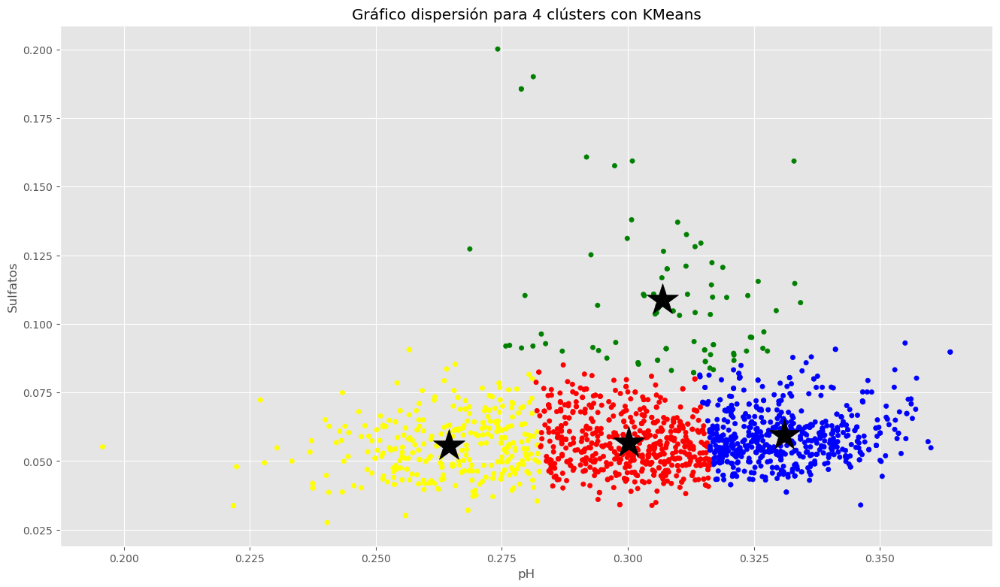

In [302]:
# Getting the values and plotting it
f1 = wine[0].values
f2 = wine[1].values
f3 = wine[2].values
 
plt.scatter(f1, f2, c=asignar, s=20)
plt.scatter(C[:, 0], C[:, 1], marker='*', c="black", s=1000)
plt.xlabel('pH')
plt.ylabel('Sulfatos')
plt.title('Gráfico dispersión para 4 clústers con KMeans')

plt.show()

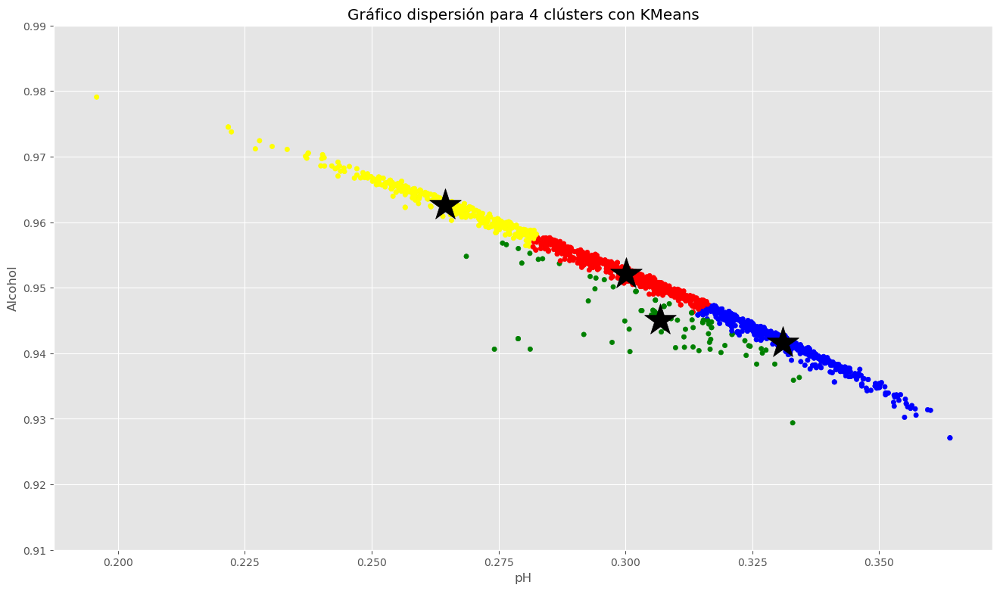

In [303]:
plt.scatter(f1, f3, c=asignar, s=20)
plt.scatter(C[:, 0], C[:, 2], marker='*', c="black", s=1000)
plt.ylim(0.91, 0.99)
plt.xlabel('pH')
plt.ylabel('Alcohol')
plt.title('Gráfico dispersión para 4 clústers con KMeans')

plt.show()

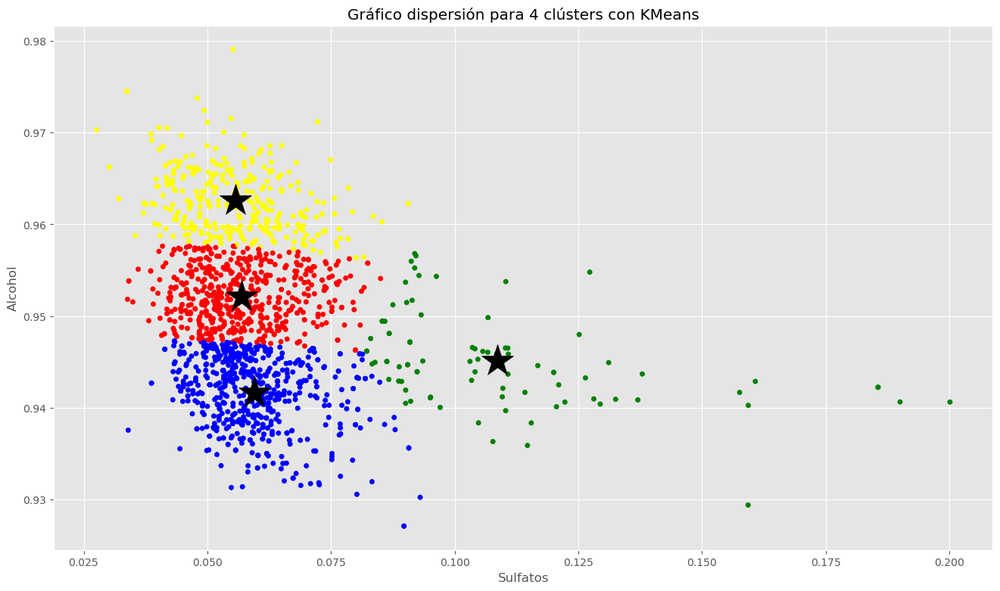

In [304]:
plt.scatter(f2, f3, c=asignar, s=20)
plt.scatter(C[:, 1], C[:, 2], marker='*', c="black", s=1000)
plt.xlabel('Sulfatos')
plt.ylabel('Alcohol')
plt.title('Gráfico dispersión para 4 clústers con KMeans')

plt.show()

Viendo esto podríamos plantearnos disponer de 2 grupos, o incluso ningún grupo, ya que los datos están muy mezclados sin poder determinar grupos claros en sí. Comprobamos con 2

In [241]:
kmeans_2 = KMeans(n_clusters=2, n_init=10, random_state=42).fit(X)

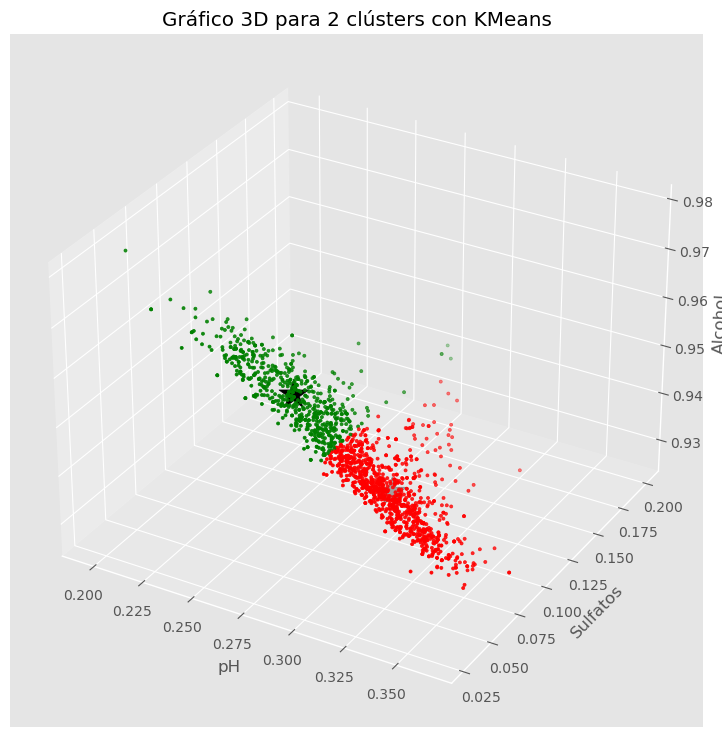

In [295]:

# Predicting the clusters
labels = kmeans_2.predict(X)
# Getting the cluster centers
C = kmeans_2.cluster_centers_
colores=['red','green']
asignar=[]
for row in labels:
    asignar.append(colores[row])

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=asignar,s=5)
ax.scatter(C[:, 0], C[:, 1], C[:, 2], marker='*', c= "black", s=500)
ax.set_xlabel('pH')
ax.set_ylabel('Sulfatos')
ax.set_zlabel('Alcohol')
plt.title('Gráfico 3D para 2 clústers con KMeans')

plt.show()

No es la agrupación que esperába, pero al agruparse los datos de esta manera k-means los agrupa así. En el supuesto de utilizar k_means, la mejor agrupación será de 4 grupos a mi parecer.

### Pregunta 10

Usando los "cluster_centers_" del clustering optimo. ¿qué dicen estos representantes de clase de cada cluster? ¿cuáles son los valores de los indices de Davies-Bouldin y de Silhouette para este conjunto de clusters?

In [244]:
kmeans_4.cluster_centers_

array([[0.30011454, 0.05682788, 0.95210577],
       [0.30682492, 0.10867626, 0.94506016],
       [0.33101139, 0.05945756, 0.94163406],
       [0.26447881, 0.05566072, 0.96262627]])

Vemos que son centroides que se encuentran muy juntos, es decir que tienen datos parecidos entre clases (excepto en el grupo verde, que se encuentra más alejado) y es más díficil de determinar con exactitud una observación cuando se encuentra cerca de otro centroide. No hay una separación clara a simple vista.

In [196]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score

In [245]:
silhouette_score(wine, kmeans_4.labels_)

0.4154517127157518

In [246]:
davies_bouldin_score(wine, kmeans_4.labels_)

0.7663265101204046

En estas dos métricas, la puntuación se define como la medida de similitud promedio de cada grupo con su grupo más similar, donde la similitud es la relación entre las distancias dentro del grupo y las distancias entre grupos.

En silhouette buscamos que sea próximo a 1 y lejano a -1. Mientras que en daives_bouldin buscamos que sea lo mínimo posible de números positivos, es decir, cercano 0.

En nuestros resultados hemos obtenido una media de todas las observaciones de 0.41 en silhouette y 0.76 en davies, lo que nos indica que más o menos podría estar bien clasificado, pero que hay muchos valores en los límites de clúster, como indicamos en un principio.

### Pregunta 11

Selecciona otro metodo de clustering que te parezca relevante e implementalo. ¿cómo se comparan los clusteres de este caso con los obtenidos en la Pregunta 1? Si tuvieras que elegir un cluster de los datos, ¿cual elegirías y por qué?

Ya visto como se distribuyen los datos y los clusters, creo que un buen método sería usar DBSCAN, que agrupa más por aglomeración, por tanto, al estar los datos tan apretados, sabremos si es mejor tener 2 (como me parece más lógico), 3, 4 o incluso ninguna.

In [248]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.05, min_samples=5).fit(X)

In [264]:
dbscan.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

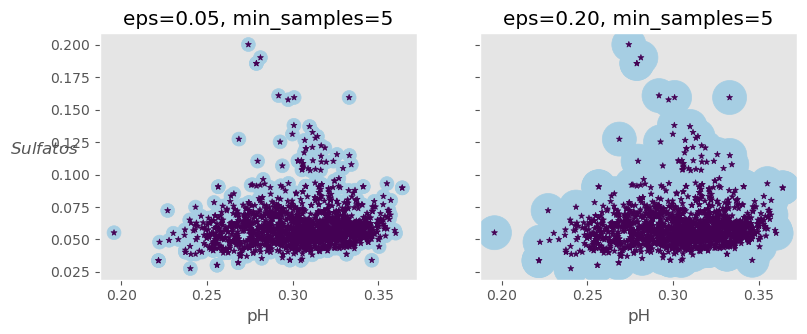

In [309]:
# extra code – this cell generates and saves Figure 9–14

def plot_dbscan(dbscan, X, size, show_xlabels=True, show_ylabels=True):
    core_mask = np.zeros_like(dbscan.labels_, dtype=bool)
    core_mask[dbscan.core_sample_indices_] = True
    anomalies_mask = dbscan.labels_ == -1
    non_core_mask = ~(core_mask | anomalies_mask)

    cores = dbscan.components_
    anomalies = X[anomalies_mask]
    non_cores = X[non_core_mask]
    
    plt.scatter(cores[:, 0], cores[:, 1],
                c=dbscan.labels_[core_mask], marker='o', s=size, cmap="Paired")
    plt.scatter(cores[:, 0], cores[:, 1], marker='*', s=20,
                c=dbscan.labels_[core_mask])
    plt.scatter(anomalies[:, 0], anomalies[:, 1],
                c="r", marker="x", s=100)
    plt.scatter(non_cores[:, 0], non_cores[:, 1],
                c=dbscan.labels_[non_core_mask], marker=".")
    if show_xlabels:
        plt.xlabel("pH")
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$Sulfatos$", rotation=0)
    else:
        plt.tick_params(labelleft=False)
    plt.title(f"eps={dbscan.eps:.2f}, min_samples={dbscan.min_samples}")
    plt.grid()
    plt.gca().set_axisbelow(True)

dbscan2 = DBSCAN(eps=0.2)
dbscan2.fit(X)

plt.figure(figsize=(9, 3.2))

plt.subplot(121)

plot_dbscan(dbscan, X, size=100)

plt.subplot(122)
plot_dbscan(dbscan2, X, size=600, show_ylabels=False)

plt.show()

In [250]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=50)
knn.fit(dbscan.components_, dbscan.labels_[dbscan.core_sample_indices_])

KNeighborsClassifier(n_neighbors=50)

In [316]:
names(knn.predict(X))

['T', 'all', 'any', 'argmax', 'argmin', 'argpartition', 'argsort', 'astype', 'base', 'byteswap', 'choose', 'clip', 'compress', 'conj', 'conjugate', 'copy', 'ctypes', 'cumprod', 'cumsum', 'data', 'diagonal', 'dot', 'dtype', 'dump', 'dumps', 'fill', 'flags', 'flat', 'flatten', 'getfield', 'imag', 'item', 'itemset', 'itemsize', 'max', 'mean', 'min', 'nbytes', 'ndim', 'newbyteorder', 'nonzero', 'partition', 'prod', 'ptp', 'put', 'ravel', 'real', 'repeat', 'reshape', 'resize', 'round', 'searchsorted', 'setfield', 'setflags', 'shape', 'size', 'sort', 'squeeze', 'std', 'strides', 'sum', 'swapaxes', 'take', 'tobytes', 'tofile', 'tolist', 'tostring', 'trace', 'transpose', 'var', 'view']


In [321]:
knn.predict(X)

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [322]:
knn.predict(X).max()

0

Vemos que solo predice para una clase. Es decir, que no existe ninguna agrupación posible.

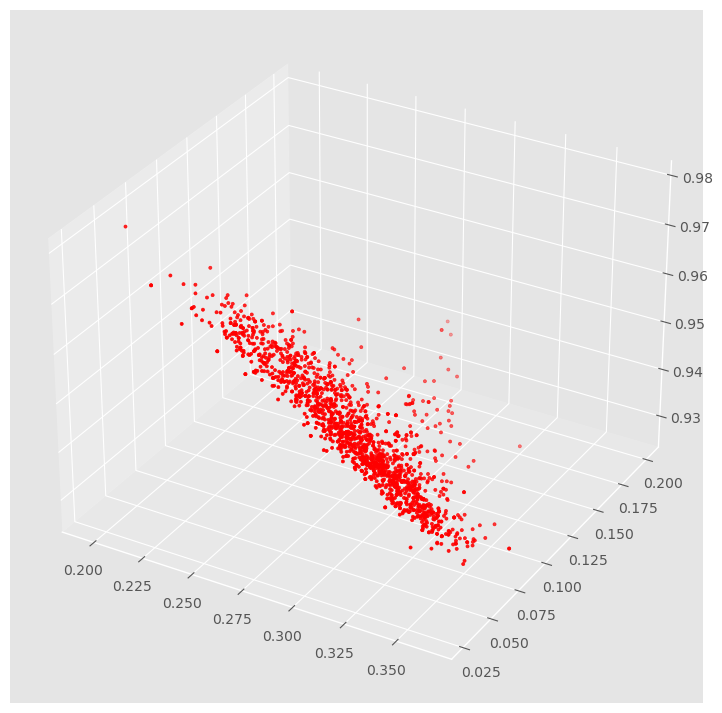

In [272]:
# Predicting the clusters
labels = knn.predict(X)
# Getting the cluster centers
colores=['red','green']
asignar=[]
for row in labels:
    asignar.append(colores[row])

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=asignar,s=5)
ax.set_xlabel('pH')
ax.set_ylabel('Sulfatos')
ax.set_zlabel('Alcohol')
plt.title('Gráfico 3D con predicciones knn ')

plt.show()

Según el algoritmo DBSCAN, no deberíamos realizar ninguna agrupación, el cual me parece un resultado satisfactorio ya que no se aprecia una separación clara o al menos no muy lógica. Veamos con el algoritmo de Spectral clustering.

In [275]:
from sklearn.cluster import SpectralClustering

In [376]:
sc1 = SpectralClustering(n_clusters=2, gamma=10, random_state=42)
sc1.fit(X)

SpectralClustering(gamma=10, n_clusters=2, random_state=42)

In [378]:
sc1.affinity_matrix_.round(2)

array([[1.  , 0.98, 0.99, ..., 0.97, 0.99, 0.97],
       [0.98, 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
       [0.99, 1.  , 1.  , ..., 1.  , 1.  , 0.99],
       ...,
       [0.97, 1.  , 1.  , ..., 1.  , 0.99, 1.  ],
       [0.99, 1.  , 1.  , ..., 0.99, 1.  , 0.99],
       [0.97, 1.  , 0.99, ..., 1.  , 0.99, 1.  ]])

In [285]:
sc2 = SpectralClustering(n_clusters=3, gamma=10, random_state=42)
sc2.fit(X)

SpectralClustering(gamma=10, n_clusters=3, random_state=42)

In [279]:
sc2.affinity_matrix_.round(2)

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

In [370]:
def plot_spectral_clustering(sc, X, size, alpha, show_xlabels=True,
                             show_ylabels=True):
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=size, c='gray', alpha=alpha)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=30, c='w')
    plt.scatter(X[:, 0], X[:, 1], marker='.', s=10, c=sc.labels_, cmap="Paired")
    
    if show_xlabels:
        plt.xlabel("pH")
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("Sulfatos", rotation=0)
    else:
        plt.tick_params(labelleft=False)
    plt.title(f"RBF gamma={sc.gamma}")

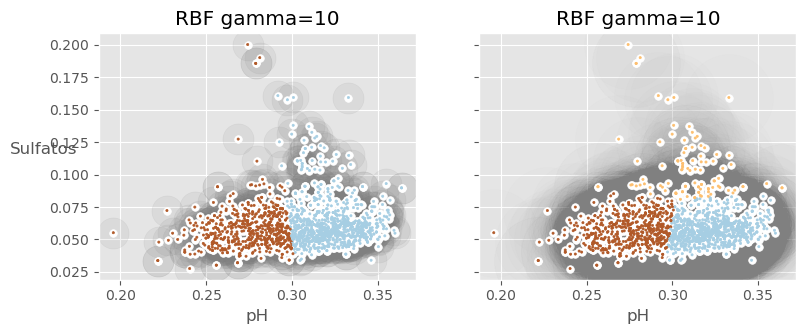

In [379]:
plt.figure(figsize=(9, 3.2))

plt.subplot(121)
plot_spectral_clustering(sc1, X, size=500, alpha=0.1)

plt.subplot(122)
plot_spectral_clustering(sc2, X, size=4000, alpha=0.01, show_ylabels=False)

plt.show()

Seguimos sin obtener la agrupación de 2 clusters que me satisfaga. Mientras que la agrupación de 3 clusters, me gusta más la agrupación que ha con SC que la obtenida con k-means. 

Probemos por últimas con agglomerative Clustering.

In [325]:
from sklearn.cluster import AgglomerativeClustering

In [334]:
agg = AgglomerativeClustering(linkage="complete").fit(X)

In [335]:
def learned_parameters(estimator):
    return [attrib for attrib in dir(estimator)
            if attrib.endswith("_") and not attrib.startswith("_")]

In [336]:
learned_parameters(agg)

['children_',
 'labels_',
 'n_clusters_',
 'n_connected_components_',
 'n_features_in_',
 'n_leaves_']

In [333]:
agg.children_

array([[   0,    4],
       [ 154,  156],
       [1245, 1247],
       ...,
       [3188, 3193],
       [3190, 3191],
       [3194, 3195]])

In [338]:
agg.n_clusters

2

In [343]:
agg.fit_predict(X)

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

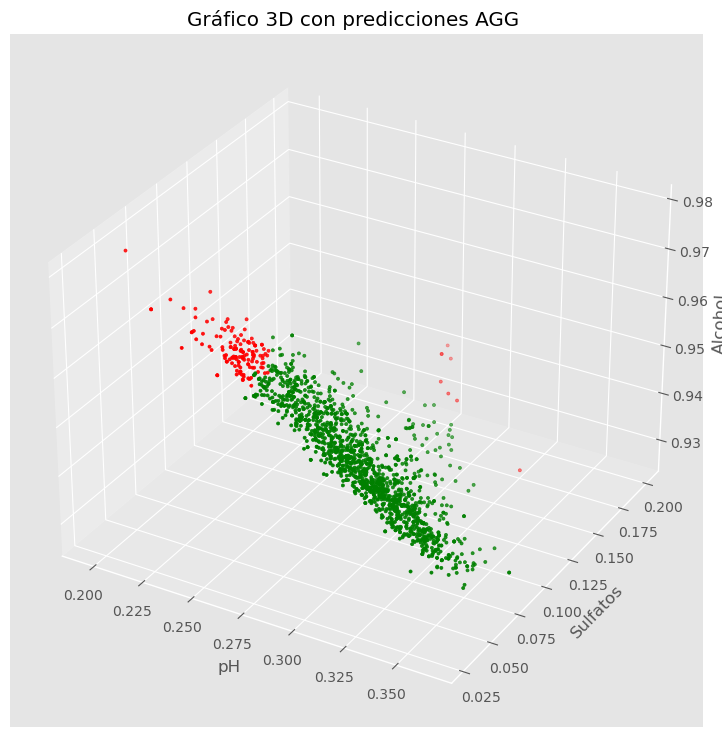

In [345]:
# Predicting the clusters
labels = agg.fit_predict(X)
# Getting the cluster centers
colores=['red','green']
asignar=[]
for row in labels:
    asignar.append(colores[row])

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=asignar,s=5)
ax.set_xlabel('pH')
ax.set_ylabel('Sulfatos')
ax.set_zlabel('Alcohol')
plt.title('Gráfico 3D con predicciones AGG ')

plt.show()

Definitivamente no ha hecho una agrupación buena de los datos.

En clonclusión, la mejor de las agrupaciones es ninguna, es decir con el algoritmo DBSCAN. Pienso que no es recomendable hacer una agrupación cuando existen datos tan unidos, lo cual significa que no habría precisión ni seguridad en determinar si lo que estamos clasificando está bien ni por qué. Lo único que me podría convencer más sería una agrupación de 2, entre los datos que están más separados de la aglomeración, y la propia aglomeración, pero como no ha sido posible con ninguna, me quedo con el algoritmo DBSCAN.

## Conjunto 4

### Pregunta 12

El fichero hr_train.cvs contiene una tabla sobre los empleados de una empresa. Entre otros incluye información de su nivel de satisfacción, de la última evaluación obtenida, del numero de proyecto en el que se encuentra, del número medio de horas por semana, del número de años que lleva en la compañía, si ha tenido o no un accidente en el trabajo, si se ha ido (left) de la compañia, si ha tenido una promocion en los ultimos 5 años, y por último su nivel salarial (descrito como medio, alto o bajo) y el departamento en que se encuentra (sales/technnical ...)

#### El departamento de RRHH esta solicitando un clasificador que pueda predecir si alguien esta en riesgo de irse de la compañia para poder actuar  proactivamente. 

Notas:
- La columna "left" indica si alguien se ha ido de la compañia, es la "y" del problema.
- Las columnas "sales" y "salary" son alfanuméricas. La mayoría de clasificadores (aunque no todos) no trabajan bien con este tipo de variables y requieren valores numéricos. Dado el caso dispones de diferentes alternativas: (1) eliminar esas columnas y trabajar con el resto o (2) traducir esas columnas en columnas binarias - por ejemplo si "salary" tiene tres valores eliminar la columna original y sustituirla por tres columnas salary_low, salary_medium, salary_high donde se pondra un 1 en el tipo de salario y un 0 en las otras dos columnas restantes. Lo mismo para "sales", donde se transformara esa columna en tantas columnas como departamentos y un 1 en el departamento en que se encuentre el trabajador. Este es un preproceso muy tipico.

Nota de evaluación:

En este ejercicio más que el resultado final (que tambien) se evaluarán los pasos y el razonamiento utilizado en cada decisión que se toma para la implementación del modelo. 


In [2]:
import pandas as pd
import numpy as np

file1=r'hr_train.csv'

ci=pd.read_csv(file1)
ci.tail()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,sales,salary
10494,0.82,0.84,3,237,2,0,0,0,technical,low
10495,0.85,0.81,3,205,3,0,0,0,marketing,high
10496,0.32,0.95,5,172,2,0,1,0,sales,low
10497,0.51,0.76,4,140,3,0,1,0,support,low
10498,0.80,0.68,4,199,2,0,0,0,IT,medium


In [507]:
ci.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10499 entries, 0 to 10498
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     10499 non-null  float64
 1   last_evaluation        10499 non-null  float64
 2   number_project         10499 non-null  int64  
 3   average_montly_hours   10499 non-null  int64  
 4   time_spend_company     10499 non-null  int64  
 5   Work_accident          10499 non-null  int64  
 6   left                   10499 non-null  int64  
 7   promotion_last_5years  10499 non-null  int64  
 8   sales                  10499 non-null  object 
 9   salary                 10499 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 820.4+ KB


In [3]:
ci['Work_accident'] = ci['Work_accident'].astype('object')
ci['left'] = ci['left'].astype('object')
ci['promotion_last_5years'] = ci['promotion_last_5years'].astype('object')

In [509]:
ci.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10499 entries, 0 to 10498
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     10499 non-null  float64
 1   last_evaluation        10499 non-null  float64
 2   number_project         10499 non-null  int64  
 3   average_montly_hours   10499 non-null  int64  
 4   time_spend_company     10499 non-null  int64  
 5   Work_accident          10499 non-null  object 
 6   left                   10499 non-null  object 
 7   promotion_last_5years  10499 non-null  object 
 8   sales                  10499 non-null  object 
 9   salary                 10499 non-null  object 
dtypes: float64(2), int64(3), object(5)
memory usage: 820.4+ KB


In [510]:
ci.left.value_counts()

left
0    7424
1    3075
Name: count, dtype: int64

In [511]:
3075/10498

0.2929129357972947

In [512]:
ci.salary.value_counts()

salary
low       5104
medium    4515
high       880
Name: count, dtype: int64

In [513]:
ci.sales.value_counts()

sales
sales          2935
technical      1890
support        1556
IT              825
product_mng     639
marketing       614
hr              532
RandD           530
accounting      527
management      451
Name: count, dtype: int64

In [514]:
ci.Work_accident.value_counts()

Work_accident
0    8984
1    1515
Name: count, dtype: int64

In [515]:
ci.promotion_last_5years.value_counts()

promotion_last_5years
0    10271
1      228
Name: count, dtype: int64

Lo primero es realizar un pequeño análisis descriptivo de las variables antes de continuar con el preprocesamiento. 

Con el código realizado anteriormente podemos analizar un poco la situación en cuanto a las variables categóricas. Vemos que la mayoría se encuentra en el departamento de ventas, seguido del departamento técnico y soporte. Después baja gradualmente desde el departamento informático hasta la dirección donde se encuentra la menor parte de los empleados. En cuanto a los accidentes de trabajo, hay un numero considerable a pesar de que se trata de un trabajo de oficina. La promoción los últimos 5 años ha sido muy baja, en torno al 2%.
Por otro lado, vemos que el salario bajo predomina en la empresa, y es bastante similar al salario medio. El salario alto se da en relativamente pocos empleados (casi un 10%). 
Y finalmente, la cantidad de personal que se ha ido de la empresa es elevado, concretamente el 29% de los empleados se ha ido en todo el histórico.

In [516]:
ci.describe()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company
count,10499.000000,10499.000000,10499.000000,10499.000000,10499.000000
mean,0.612683,0.717131,3.808553,201.059815,3.494238
std,0.248578,0.171483,1.230572,49.959332,1.453227
min,0.090000,0.360000,2.000000,96.000000,2.000000
25%,0.440000,0.560000,3.000000,156.000000,3.000000
50%,0.640000,0.720000,4.000000,200.000000,3.000000
75%,0.820000,0.870000,5.000000,245.000000,4.000000
max,1.000000,1.000000,7.000000,310.000000,10.000000


Vemos que la satisfacción media está por encima de 0.5, pero con una desviación típica elevada, lo que significa que también hay una cantidad considerable de gente descontenta. La última evaluación es positiva. Poseen un número de proyectos medio, aunque hay la carga de trabajo no parece estar equilibrada. Hacen de media más horas de las establecidas regularmente por ley, llegando algunos a casi doblar la jornada. Y los años de permanencia en la empresa es una media de 3.5 años, siendo el máximo 10 años, que según la edad de la empresa, estos pueden ser unos números relativamente bajos.

In [517]:
ci.isnull().sum()

satisfaction_level       0
last_evaluation          0
number_project           0
average_montly_hours     0
time_spend_company       0
Work_accident            0
left                     0
promotion_last_5years    0
sales                    0
salary                   0
dtype: int64

No poseemos valores nulos en todo el dataset.

Vamos a analizar por pares de variables según lo que tenga más coherencia analizar. Como lo que queremos es saber el por qué la gente se va, vamos a analizar la varaible left junto con otras, así como la variable salario y satisfacción que suelen ser el mayor condicionante por lo que uno decide irse.

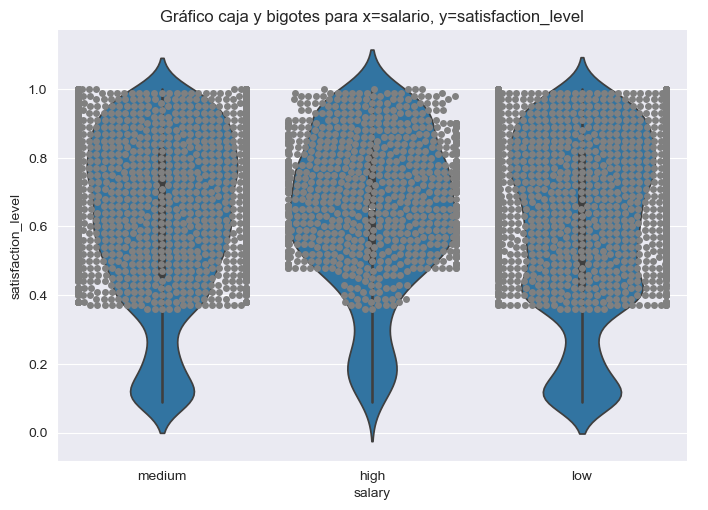

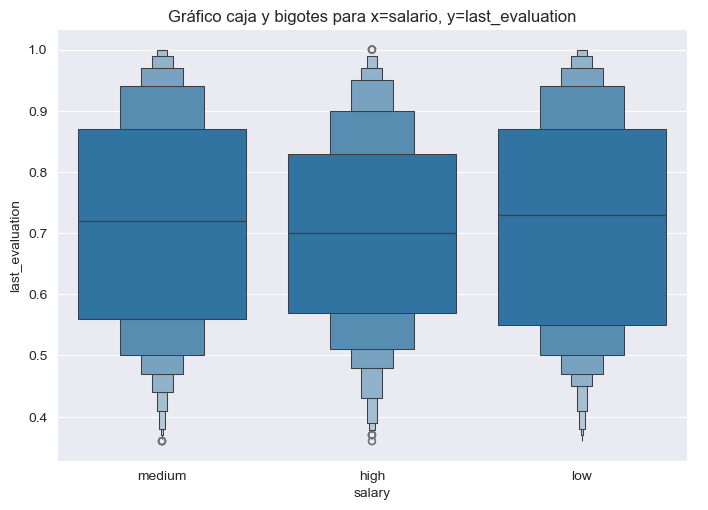

In [30]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
ax= sns.set_style("darkgrid")
ax= sns.catplot(data = ci, x = "salary", y = "satisfaction_level", kind = "violin", aspect = 1.4).set(title="Gráfico caja y bigotes para x=salario, y=satisfaction_level")
ax = sns.swarmplot(data = ci, x = "salary", y = "last_evaluation", color="grey")
ax=sns.catplot(data = ci, x = "salary", y = "last_evaluation", kind = "boxen", aspect = 1.4).set(title="Gráfico caja y bigotes para x=salario, y=last_evaluation");
plt.show()

Vemos que los que tienen un salario bajo son los que más descontentos están. También vemos que en la última evaluación debería un poco de organizarse esto de los salarios, quien obtenga buenas evaluaciones deberían de recibir alguna promoción o beneficio para que continuen así, mientras que los que tengan una mala evaluación valorasen como actuar con dicha persona.

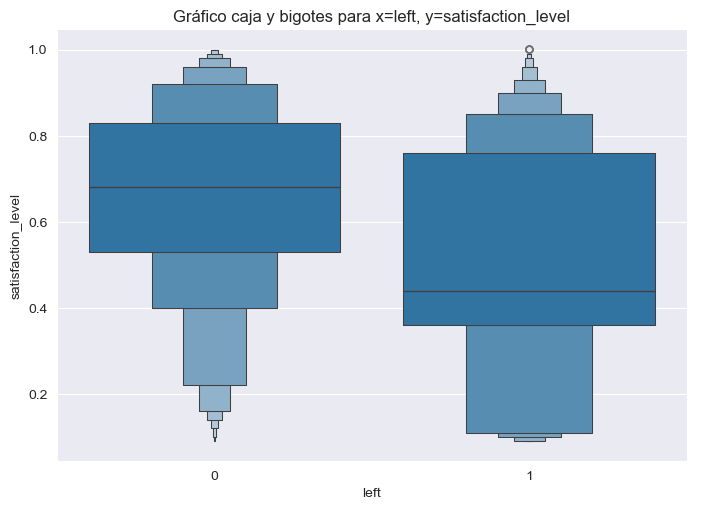

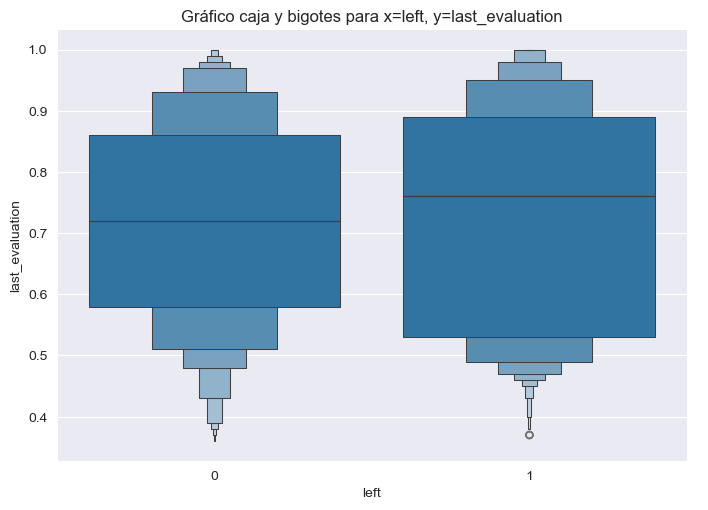

In [23]:
sns.set_style("darkgrid")
sns.catplot(data = ci, x = "left", y = "satisfaction_level", kind = "boxen", aspect = 1.4).set(title="Gráfico caja y bigotes para x=left, y=satisfaction_level")
sns.catplot(data = ci, x = "left", y = "last_evaluation", kind = "boxen", aspect = 1.4).set(title="Gráfico caja y bigotes para x=left, y=last_evaluation");

Cabía esperar que las personas con menor nivel de satisfacción fuesen los que se van, pero resulta que en la última evaluación estas personas que se fueron tiene incluso mejores valoraciones que los que no se han ido.

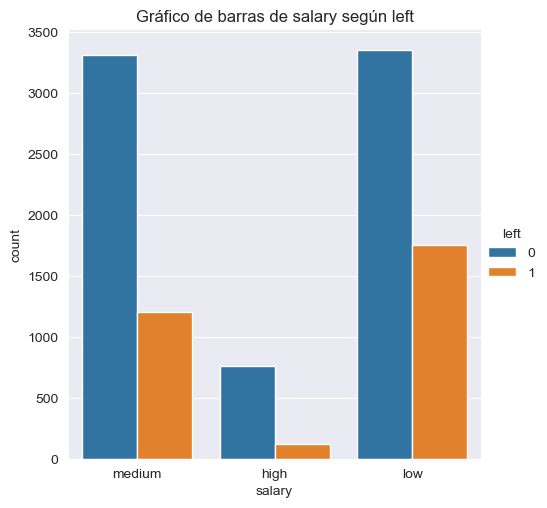

In [24]:
sns.set_style("darkgrid")
sns.catplot(data=ci, x="salary", kind="count", hue = "left").set(title="Gráfico de barras de salary según left");

Igualmente cabía esperar estos resultados. Del personal que tenia salario bajo se han ido la mitad, del salario medio en torno al 30%, y del salario alto seguramente no llegue ni a un 20%.

<Figure size 1500x700 with 0 Axes>

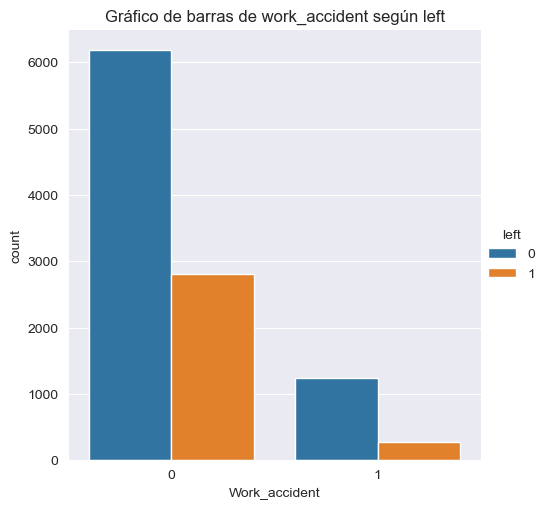

In [25]:
sns.set_style("darkgrid")
fig = plt.figure(figsize = (6, 2))
fig.set_size_inches(15, 7)
sns.catplot(data=ci, x="Work_accident", kind="count", hue = "left").set(title="Gráfico de barras de work_accident según left");

Parece que los que tuvieron un accidente de trabajo no se han ido tanto en proporción con los que no tuvieron accidente, pero creo que no podemos extraer algo relevante respceto a esto.

<Figure size 1500x700 with 0 Axes>

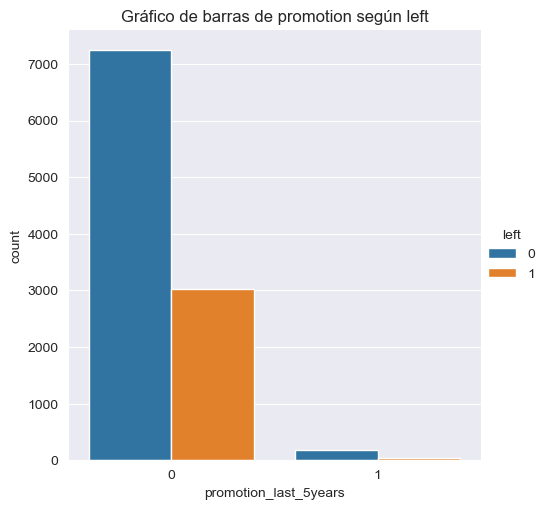

In [26]:
sns.set_style("darkgrid")
fig = plt.figure()
fig.set_size_inches(15, 7)
sns.catplot(data=ci, x="promotion_last_5years", kind="count", hue = "left").set(title="Gráfico de barras de promotion según left");

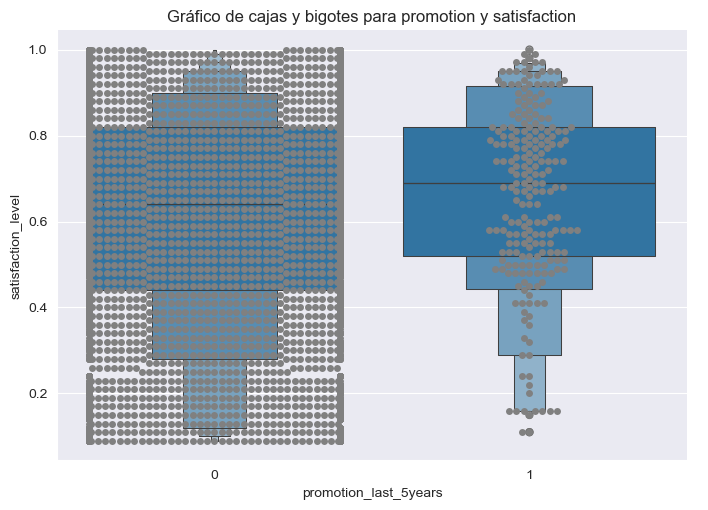

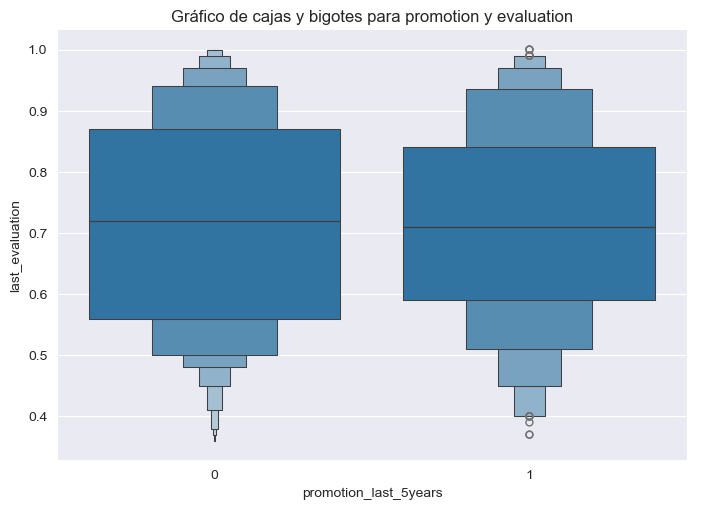

In [33]:
sns.catplot(data = ci, x = "promotion_last_5years", y = "satisfaction_level", kind = "boxen", aspect = 1.4).set(title="Gráfico de cajas y bigotes para promotion y satisfaction");
ax = sns.swarmplot(data = ci, x = "promotion_last_5years", y = "satisfaction_level", color="grey")

sns.catplot(data = ci, x = "promotion_last_5years", y = "last_evaluation", kind = "boxen", aspect = 1.4).set(title="Gráfico de cajas y bigotes para promotion y evaluation");

Parece que los que reciben promoción tienen menos probabilidades de irse. Pero hay tanta diferencia de datos que no se puede concluir nada.

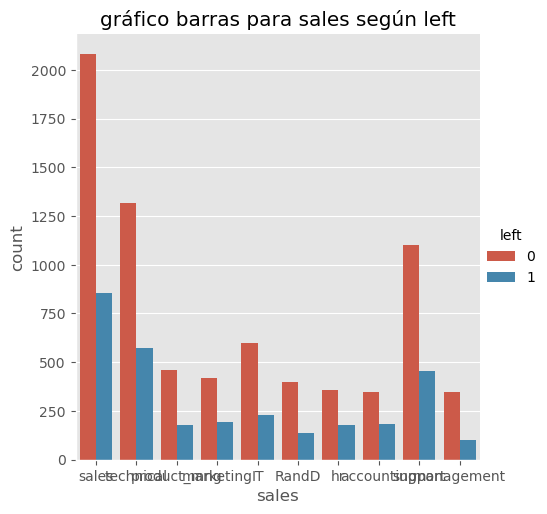

In [749]:
sns.catplot(data=ci, x="sales", kind="count", hue = "left").set(title="gráfico barras para sales según left");

Finalmente parece que en todos los departamento hay el mismo ratio de abandono, excepto en la dirección que se aprecia que hay menos que en el resto.

In [482]:
ci[["satisfaction_level", "last_evaluation", "number_project", "average_montly_hours", "time_spend_company"]].corr().round(3)

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company
satisfaction_level,1.000,0.105,-0.144,-0.029,-0.103
last_evaluation,0.105,1.000,0.358,0.334,0.122
number_project,-0.144,0.358,1.000,0.419,0.197
average_montly_hours,-0.029,0.334,0.419,1.000,0.122
time_spend_company,-0.103,0.122,0.197,0.122,1.000


En la matriz de correlaciones vemos que efectivamente, los que trabajan más y llevan más tiempo en la compañia acaban teneindo menor satisfacción (correlación negativa). Aunque en la última evaluación eso cambió muy positivamente.
Y también se aprecia que cuanto más tiempo lleva uno en la compañía, mayor es la carga de trabajo, tanto en horas como en proyectos.

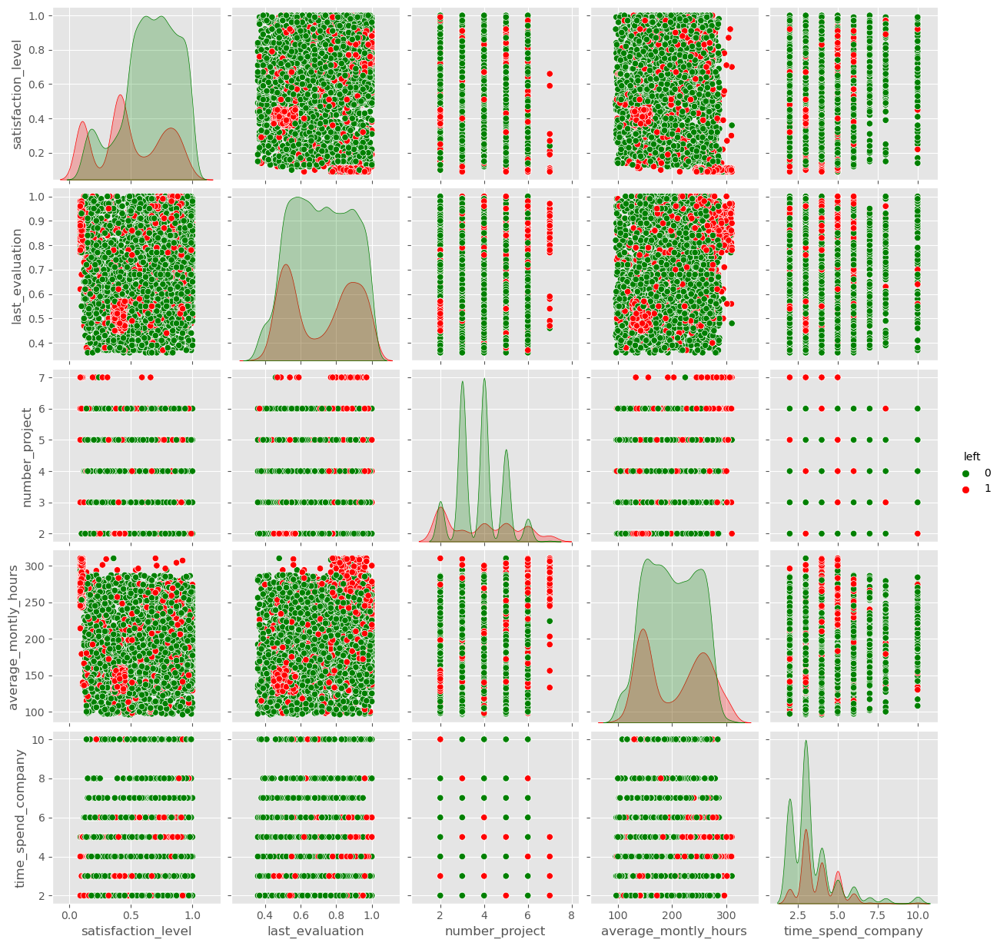

In [751]:
colores=['green', 'red']
sns.pairplot(data = ci[["satisfaction_level", "last_evaluation", "number_project", "average_montly_hours", "time_spend_company", "left"]], kind = "scatter", hue = "left", palette=colores);

En este gráfico podemos abstraer un poco más de las variables numéricas. En verde tenemos los que siguen en la empresa y en rojo los que se han ido.
Vamos en orden por la diagonal:
- La satisfacción es obviamente un elemento clave, vemos como los que siguen en la empresa tienen una proporción mucho mayor de satisfechos, mientras que los que se han ido hay un pico de insatisfechos, indiferentes y satisfechos (estos últimos quizás porque se tuvieron que ir por otros motivos).
- En la última evaluación esto cambia un poco, habiendo un poco más de descontento en los que se quedan, y habiendo dos picos en los que se fueron, indicando menos descontento general.
- Tener más número de proyecto parece ser que no influye tanto en irse o no.
- Las horas medias mensuales sí que parece que puede tener algo que ver. Parece que los que se fueron tenian demasiadas horas por un lado, y por otro tenian quizas demasiadas pocas horas. Mientras que los que se quedan tienen jornadas más distribuidas, aunque tambien hay casos en los límites.
- Por último, los años en los que se permanece en la empresa también parece influir algo, ya que la myor tasa de abandono se encuentra entre los 3 y los 5 años, quizas por no tener expectativas de promoción y crecimiento, mientras se eleva el nivel de trabajo por consecuencia.

Al analizar por pares también hay algo interesante:
- A partir de los 7 número de proyectos la tasa de abandono es practicamente total. Y tener muchas horas de trabajo mensuales tiene el mismo impacto. Y si ya juntamos estas dos circunstancias el abandono es notable.
- Si juntamos estos dos factores anteriores con los empleados que llevan menos tiempo en la compañía, el abandono se hace más propenso.

In [530]:
ci['Work_accident'] = ci['Work_accident'].astype('category').cat.codes
ci['left'] = ci['left'].astype('category').cat.codes
ci['promotion_last_5years'] = ci['promotion_last_5years'].astype('category').cat.codes

In [531]:
from sklearn.preprocessing import OrdinalEncoder

# Creamos el codificador indicandole el orden de la variables
encoder = OrdinalEncoder(categories=[["low", "medium", 
                                      "high"]])

# Ajustamos el codificador con la variable y la transformamos
encoder.fit(ci[["salary"]])
ci["salary"] = encoder.transform(ci[["salary"]])

In [532]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder

# Transforma las columnas seleccionadas con OneHotEncoder y agrega las nuevas columnas binarias con nombres correspondientes
ohe = OneHotEncoder()
cat_encoded = ohe.fit_transform(ci[["sales"]]).toarray()
onehot_col_names = ohe.get_feature_names_out(["sales"])
ci_encoded = pd.concat([ci.select_dtypes(exclude=['object']), pd.DataFrame(cat_encoded, columns=onehot_col_names)], axis=1)

# Imprime el nuevo DataFrame con las columnas transformadas
print(ci_encoded.tail())
# Imprime un listado de las columnas agregadas al DataFrame original
added_cols = list(onehot_col_names)
print("Columnas agregadas al DataFrame original:")
print(added_cols)


       satisfaction_level  last_evaluation  number_project  \
10494                0.82             0.84               3   
10495                0.85             0.81               3   
10496                0.32             0.95               5   
10497                0.51             0.76               4   
10498                0.80             0.68               4   

       average_montly_hours  time_spend_company  Work_accident  left  \
10494                   237                   2              0     0   
10495                   205                   3              0     0   
10496                   172                   2              0     1   
10497                   140                   3              0     1   
10498                   199                   2              0     0   

       promotion_last_5years  salary  sales_IT  sales_RandD  sales_accounting  \
10494                      0     0.0       0.0          0.0               0.0   
10495                      0    

In [533]:
ci_encoded.tail()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,salary,sales_IT,sales_RandD,sales_accounting,sales_hr,sales_management,sales_marketing,sales_product_mng,sales_sales,sales_support,sales_technical
10494,0.82,0.84,3,237,2,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
10495,0.85,0.81,3,205,3,0,0,0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
10496,0.32,0.95,5,172,2,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
10497,0.51,0.76,4,140,3,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
10498,0.80,0.68,4,199,2,0,0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Ya tenemos todo codificado correctamente. Lo siguiente será separar en train y test, y escalar las variables.

In [534]:
y = ci_encoded["left"]

In [535]:
ci_encoded.drop("left", inplace = True, axis = 1)

In [568]:
X_train, X_test, y_train, y_test = train_test_split(ci_encoded, y, test_size=0.2, random_state=42, stratify=y)

In [569]:
X_train

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,salary,sales_IT,sales_RandD,sales_accounting,sales_hr,sales_management,sales_marketing,sales_product_mng,sales_sales,sales_support,sales_technical
3991,0.66,0.79,5,134,3,0,0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
7267,0.93,0.97,3,256,2,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2626,0.86,0.71,3,235,3,0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4416,0.74,0.99,4,233,5,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9876,0.84,0.64,2,211,3,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4743,0.99,0.54,3,247,3,0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7586,0.94,0.73,4,204,2,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
8409,0.95,0.74,4,258,3,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1975,0.43,0.56,2,129,3,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [570]:
from sklearn.preprocessing import MinMaxScaler

minmax = MinMaxScaler().fit(X_train)

In [571]:
X_train_scaled = minmax.transform(X_train)
X_train_scaled = pd.DataFrame(X_train_scaled)
X_train_scaled.columns = X_train.columns

X_test_scaled = minmax.transform(X_test)
X_test_scaled = pd.DataFrame(X_test_scaled)
X_test_scaled.columns = X_test.columns


In [583]:
X_train.iloc[[0]]

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,salary,sales_IT,sales_RandD,sales_accounting,sales_hr,sales_management,sales_marketing,sales_product_mng,sales_sales,sales_support,sales_technical
3991,0.66,0.79,5,134,3,0,0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [586]:
X_train_scaled.loc[[0]]

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,salary,sales_IT,sales_RandD,sales_accounting,sales_hr,sales_management,sales_marketing,sales_product_mng,sales_sales,sales_support,sales_technical
0,0.626374,0.671875,0.6,0.17757,0.125,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


Al escalar las variables hemos reiniciado los índices, por tanto donde en la primera fila se encontraba el sujeto número 3991, ahora se encuentra el mismo sujeto pero el número es el 0. 
Vemos que tiene está bien escalado y tiene coherencia.

A continuación, vamos a crear un ensemble model con unos cuantos algoritmos para modelos de clasificación distinta a traves de un gridsearch para obtener los mejores parámetros de cada uno de ellos.

In [591]:
import pandas as pd
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import RepeatedStratifiedKFold, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.naive_bayes import GaussianNB


# definir los modelos y sus espacios de hiperparámetros
model_params = {
    'RandomForestClassifier': { 
        'model': RandomForestClassifier(), 
        'params': {
            'n_estimators': [10, 50, 100], 
            'max_depth': list(range(1, 30))
        }
    },
    'SVC': {
        'model': SVC(),
        'params': {
            'C': [0.1, 1, 10], 
            'kernel': ['linear', 'rbf'] 
        } 
    },
    'KNeighborsClassifier': {
        'model': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [20,25,30,35,40,45]
        }
    },
    'AdaBoostClassifier': {
        'model': AdaBoostClassifier(),
        'params': {
            'n_estimators': [50, 100],
            'learning_rate': [0.1, 1]
        }
    },
    'LR': {
        'model': LogisticRegression(),
        'params': {
            'C': [0.5,1,1.5,2,2.5,3]
        }
    },
    'NB': {
        'model': GaussianNB(),
        'params': {
            'var_smoothing': [1e-09, 1e-08, 1e-07, 1e-10, 1e-11, 1e-12] 
        }
    }
}

# definir el objeto RepeatedStratifiedKFold
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=1)

# almacenar los resultados de cross-validation, los mejores parámetros y los resultados por repetición
results = {}
best_params = {}
results_by_repeats = {}
elapsed_times = {}

for model_name, model_param in model_params.items():
    start_time = time.time()
    search = GridSearchCV(model_param['model'], model_param['params'], scoring='accuracy', cv=cv, n_jobs=-1, return_train_score=True)
    search.fit(X_train_scaled, y_train)
    elapsed_time = time.time() - start_time
    elapsed_times[model_name] = elapsed_time
    best_params[model_name] = search.best_params_
    results[model_name] = search.best_score_
    
    # Guardar los resultados de las repeticiones
    mean_test_scores = search.cv_results_['mean_test_score']
    std_test_scores = search.cv_results_['std_test_score']
    
    
    test_scores = []
    for i in range(len(mean_test_scores)):
        test_scores.append((mean_test_scores[i], std_test_scores[i]))

    results_by_repeats[model_name] = test_scores

    print(f"{model_name}: Mejor puntaje={search.best_score_:.4f}, Mejores parámetros={search.best_params_}, Tiempo de ejecución={elapsed_time:.2f} segundos")
    

RandomForestClassifier: Mejor puntaje=0.8837, Mejores parámetros={'max_depth': 13, 'n_estimators': 100}, Tiempo de ejecución=445.69 segundos
SVC: Mejor puntaje=0.8544, Mejores parámetros={'C': 10, 'kernel': 'rbf'}, Tiempo de ejecución=262.38 segundos
KNeighborsClassifier: Mejor puntaje=0.8291, Mejores parámetros={'n_neighbors': 20}, Tiempo de ejecución=59.30 segundos
AdaBoostClassifier: Mejor puntaje=0.8574, Mejores parámetros={'learning_rate': 1, 'n_estimators': 100}, Tiempo de ejecución=21.39 segundos
LR: Mejor puntaje=0.7243, Mejores parámetros={'C': 2.5}, Tiempo de ejecución=2.48 segundos
NB: Mejor puntaje=0.7158, Mejores parámetros={'var_smoothing': 1e-09}, Tiempo de ejecución=1.11 segundos


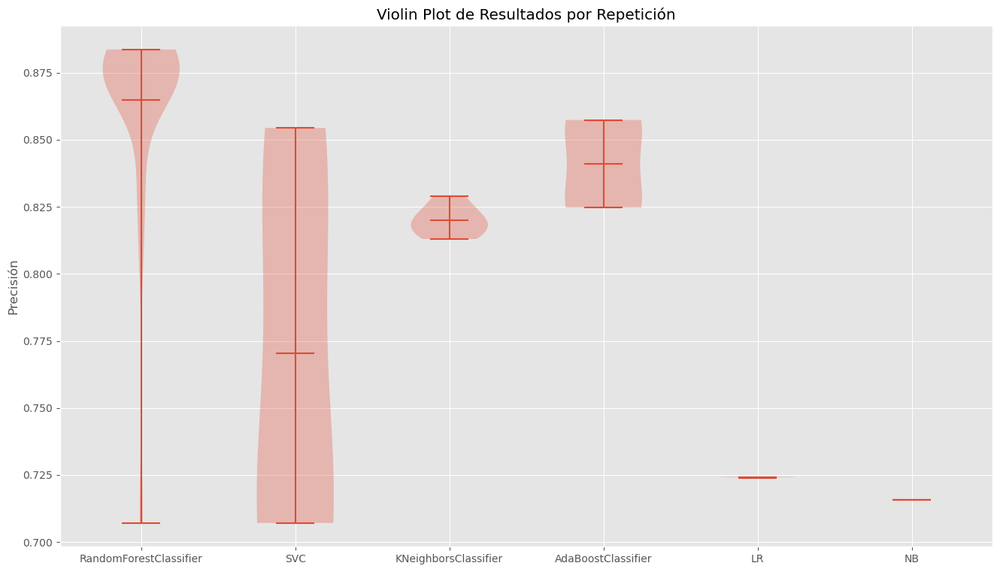

In [592]:
# Violin plot de los resultados por repetición
import matplotlib.pyplot as plt

labels = list(model_params.keys())
mean_scores = []

for k in model_params.keys():
    mean_scores.append([x[0] for x in results_by_repeats[k]])

fig, ax = plt.subplots()
ax.violinplot(mean_scores, positions=range(len(model_params)), showmeans=True)
ax.set_xticks(range(len(model_params)))
ax.set_xticklabels(labels)
ax.set_ylabel("Precisión")
ax.set_title("Violin Plot de Resultados por Repetición")
plt.show()


De los 100 estimadores de RandomForest, en la gran mayoría ha obtenido mejores resultados que el resto. Y en cuanto a logisticRegresion y NaibeBayes, estos han dado los peores resultados.
Para crear un Ensemble con todos estos modelos, deberíamos hacerlo a traves de un Soft Voting, ya que los pesos de las votaciones de LR y NB serán menores que el resto al tener peor Score. 

Primero creamos los modelos con los mejores parámetros encontrados.

In [ ]:
{'C': 10, 'kernel': 'rbf'}, Tiempo de ejecución=262.38 segundos
KNeighborsClassifier: Mejor puntaje=0.8291, Mejores parámetros={'n_neighbors': 20}, Tiempo de ejecución=59.30 segundos
AdaBoostClassifier: Mejor puntaje=0.8574, Mejores parámetros={'learning_rate': 1, 'n_estimators': 100}, Tiempo de ejecución=21.39 segundos
LR: Mejor puntaje=0.7243, Mejores parámetros={'C': 2.5}, Tiempo de ejecución=2.48 segundos
NB: Mejor puntaje=0.7158, Mejores parámetros={'var_smoothing': 1e-09}

In [597]:
clftsgrid = {'SVC': SVC(C=10, kernel="rbf", probability=True).fit(X_train_scaled, y_train), 
        'LR': LogisticRegression(C=2.5).fit(X_train_scaled, y_train),
        'AB': AdaBoostClassifier(learning_rate=1, n_estimators=100).fit(X_train_scaled, y_train),
        'NB': GaussianNB(var_smoothing=1e-09).fit(X_train_scaled, y_train),
        'RF': RandomForestClassifier(max_depth = 13, n_estimators = 100).fit(X_train_scaled, y_train),
        'KNN': KNeighborsClassifier(n_neighbors=20).fit(X_train_scaled, y_train)
        }
base_models_t = ['SVC', 'LR','AB','NB', 'RF', 'KNN']

In [598]:
for key in clftsgrid.keys():
    acc = clftsgrid[key].score(X_train_scaled, y_train)
    print(f"{key}: {(acc*100):.4f}%")

SVC: 86.4389%
LR: 72.5801%
AB: 85.9626%
NB: 71.9729%
RF: 90.2965%
KNN: 83.9981%


In [599]:
for key in clftsgrid.keys():
    acc = clftsgrid[key].score(X_test_scaled, y_test)
    print(f"{key}: {(acc*100):.4f}%")

SVC: 85.3810%
LR: 72.1429%
AB: 84.7619%
NB: 71.0952%
RF: 87.4762%
KNN: 83.4762%


In [601]:
from sklearn.ensemble import VotingClassifier

#Define the ensemble with the classifier previously used
clftsgrid['Ensemble (Hard Voting)'] = VotingClassifier (estimators = [(name,clftsgrid[name]) for name in base_models_t], 
                                                   n_jobs=-1)
clftsgrid['Ensemble (Hard Voting)'].fit(X_train_scaled, y_train)

acc=clftsgrid['Ensemble (Hard Voting)'].score(X_test_scaled, y_test)

print(f"{'Ensemble (Hard Voting)'}: {(acc*100):.4f}%")

Ensemble (Hard Voting): 84.9048%


In [602]:
#Define the ensemble with the classifier previously used
clftsgrid['Ensemble (Soft Voting)'] = VotingClassifier (estimators = [(name,clftsgrid[name]) for name in base_models_t], n_jobs=-1, voting='soft',weights=[2,1,2,0.5,1,2])
clftsgrid['Ensemble (Soft Voting)'].fit(X_train_scaled, y_train)

acc=clftsgrid['Ensemble (Soft Voting)'].score(X_test_scaled, y_test)

print(f"{'Ensemble (Soft Voting)'}: {(acc*100):.4f}%")

Ensemble (Soft Voting): 85.7143%


Una vez creado el modelo vamos a comprobar como funciona con el caso de una persona que lleva 9 años en la empresa trabajando 180 en el departamento de ventas, con un número de proyectos nulo, y un nivel de satisfacción muy bajo.

In [688]:
new = np.array([0.15, 0.11, 0, 180, 9, 0, 0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0])
new

array([1.5e-01, 1.1e-01, 0.0e+00, 1.8e+02, 9.0e+00, 0.0e+00, 0.0e+00,
       0.0e+00, 0.0e+00, 0.0e+00, 0.0e+00, 0.0e+00, 0.0e+00, 0.0e+00,
       0.0e+00, 1.0e+00, 0.0e+00, 0.0e+00])

In [689]:
new = new.reshape(1, -1)

In [690]:
new

array([[1.5e-01, 1.1e-01, 0.0e+00, 1.8e+02, 9.0e+00, 0.0e+00, 0.0e+00,
        0.0e+00, 0.0e+00, 0.0e+00, 0.0e+00, 0.0e+00, 0.0e+00, 0.0e+00,
        0.0e+00, 1.0e+00, 0.0e+00, 0.0e+00]])

In [691]:
new_scaled = minmax.transform(new)
new = pd.DataFrame(new_scaled)
new.columns = X_train.columns
new

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,salary,sales_IT,sales_RandD,sales_accounting,sales_hr,sales_management,sales_marketing,sales_product_mng,sales_sales,sales_support,sales_technical
0,0.065934,-0.390625,-0.4,0.392523,0.875,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [707]:
print(clftsgrid['Ensemble (Soft Voting)'].predict(new))
print(clftsgrid['Ensemble (Soft Voting)'].predict_proba(new))

[1]
[[0.37403207 0.62596793]]


Lo ha clasificado como que se marcharía. No es muy buena predicción, aunque tampoco se lo hemos dejado fácil. 

In [712]:
clftsgrid_probs = clftsgrid['Ensemble (Soft Voting)'].predict_proba(X_test_scaled)
print(clftsgrid_probs)

[[0.38265737 0.61734263]
 [0.81516037 0.18483963]
 [0.36851668 0.63148332]
 ...
 [0.76622737 0.23377263]
 [0.71647375 0.28352625]
 [0.62373745 0.37626255]]


In [711]:
from sklearn.metrics import confusion_matrix

clftsgrid_predicted = clftsgrid['Ensemble (Soft Voting)'].predict(X_test_scaled)
confusion = confusion_matrix(y_test, clftsgrid_predicted)

print('Ensemble', confusion)

Ensemble [[1417   68]
 [ 232  383]]


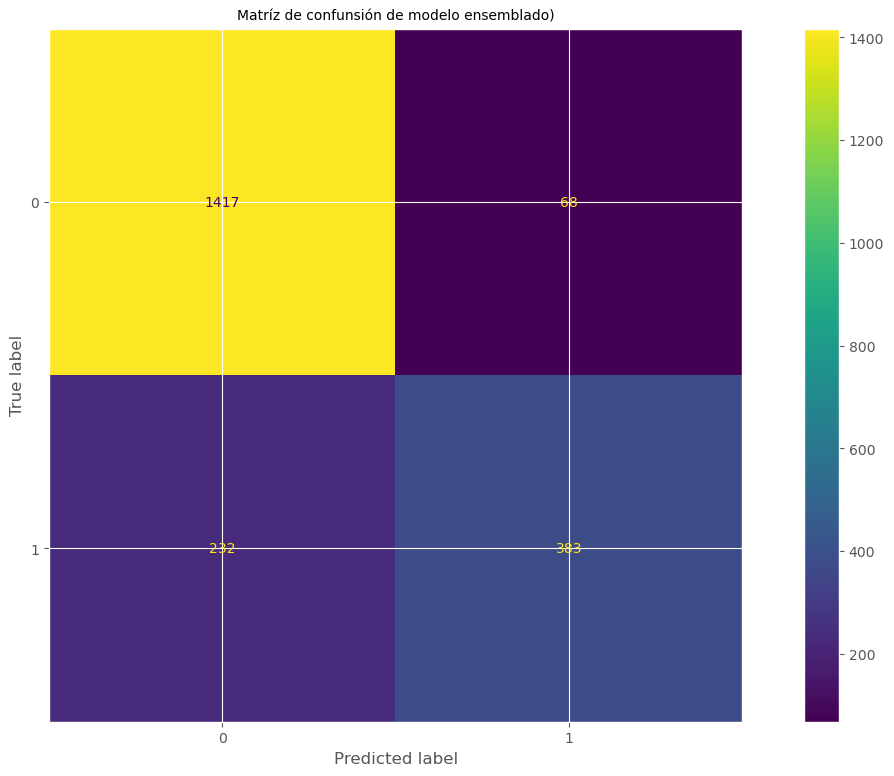

In [714]:
from sklearn.metrics import ConfusionMatrixDisplay

disp = ConfusionMatrixDisplay(confusion_matrix=confusion)
disp.plot()

plt.title("Matríz de confunsión de modelo ensemblado)", fontsize=10)

plt.show()

In [55]:
from sklearn.metrics import classification_report

print(classification_report(y_test, search_predicted))

              precision    recall  f1-score   support

           0       0.71      0.92      0.80      3762
           1       0.72      0.37      0.49      2238

    accuracy                           0.71      6000
   macro avg       0.72      0.64      0.64      6000
weighted avg       0.71      0.71      0.68      6000



Justamente para predecir 0 (que se mantiene en la empresa) el modelo funciona bien, pero para predecir 1 (que se va) falla mucho. 

Aun así, es un buen modelo para poder actuar en estas personas y obtener un feedback para arreglar el problema y conseguir que no se marchen de la empresa un número elevado de personas. Todos los que prediga el modelo como que se han ido, y aun no se han ido, sería un buen momento para ver cuál es la situación de estas personas.